# **BiciMAD**

A través del [portal de datos abiertos del Ayuntamiento de Madrid](https://datos.madrid.es/portal/site/egob/) pueden obtenerse datasets relativos a actividades de MercaMadrid, tráfico, meteorología, demografía....


También ofrece datos del servicio de alquiler de bicicletas eléctricas del Ayuntamiento de Madrid: BiciMAD. 

El objetivo de BiciMAD es proporcionar un elemento alternativo de transporte limpio y saludable al ciudadano y fomentar el uso de la bicicleta en la ciudad. A día de hoy, el sistema está compuetos por:
* 2964 bicicletas,
* 6315 anclajes,
* 264 estaciones.

Cada estación está compuesta por una serie de anclajes -bases- en las que deposita -o extrae- la bicicleta utilizada.
   

BiciMAD destaca por el empleo de las Tecnologías de la Información y la Comunicación para mejorar la experiencia del usuario, aumentar la interactividad multiplataforma y permitir la transparencia mediante la compartición de datos.

Los origenes de este trabajo con datos de BiciMAD se remontan a 2020. Inicialmente, se definió un periodo de estudio comprendido entre Julio de 2018 y Junio de 2019, ambos inclusive, para estudiar un año completo que, en su momento, eran los últimos datos disponibles. Pueden consultarse los datasets disponibles a día de hoy en el siguiente [enlace](https://opendata.emtmadrid.es/Datos-estaticos/Datos-generales-(1)).

Tras analizar varios aspectos de interés, se estableció Junio de 2019 como el mes de más interés por, entre otros motivos, ser en el que más viajes se habían producido.

Los objetivos de aquel proyecto eran la aplicación de algoritmos de teoría de grafos -algoritmos de Floyd, Prim,....- y puede consultarse en el siguiente [repositorio de GitHub](https://github.com/Jesus-Octavio/BiciMAD).

Manteniendo los viajes de Junio de 2019, haremos un Análisis de Redes Sociales con las métricas y técnicas vistas en el DataLab de Ciencias Sociales.

## PUESTA A PUNTO

Inicialmente, es necesario acceder a la unidad de Google Drive en la que se almacenan los archivos que vamos a utilizar:

In [1]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


Establecemos la ruta de acceso:

In [2]:
path = '/content/drive/Shared drives/BICIMAD/download/'

[Apache Spark](https://spark.apache.org/) es un framework de computación clúster en open-source. Se puede considerar un sistema de computación en clúster de propósito general y orientado a la velocidad. Existen APIs en Java, Scala, R y Python. También proporciona un motor optimizado que soporta la ejecución de gráficos en general y un conjunto extenso y rico de herramientas de alto nivel entre las que se incluyen Spark SQL.

Necesitamos intalar JAVA para poder usar PySpark, el API  de Apache Spark para Python:

In [3]:
!apt-get install openjdk-8-jdk
import os
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-8-openjdk-amd64"
!pip install pyspark

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  fonts-dejavu-core fonts-dejavu-extra libatk-wrapper-java
  libatk-wrapper-java-jni libgail-common libgail18 libgtk2.0-0 libgtk2.0-bin
  libgtk2.0-common libxxf86dga1 openjdk-8-jdk-headless openjdk-8-jre
  openjdk-8-jre-headless x11-utils
Suggested packages:
  gvfs openjdk-8-demo openjdk-8-source visualvm icedtea-8-plugin libnss-mdns
  fonts-ipafont-gothic fonts-ipafont-mincho fonts-wqy-microhei
  fonts-wqy-zenhei fonts-indic mesa-utils
The following NEW packages will be installed:
  fonts-dejavu-core fonts-dejavu-extra libatk-wrapper-java
  libatk-wrapper-java-jni libgail-common libgail18 libgtk2.0-0 libgtk2.0-bin
  libgtk2.0-common libxxf86dga1 openjdk-8-jdk openjdk-8-jdk-headless
  openjdk-8-jre openjdk-8-jre-headless x11-utils
0 upgraded, 15 newly installed, 0 to remove and 40 not upgraded.
Need to get 43.5 MB of archives.
After this 

Para el Análisis de Redes Sociales, emplearemos la librería [netwrokx](https://networkx.org/). Se trata de un paquete de Python destinado a la creación, manipulación y el estudio de la estructura, dinámicas y funciones de redes complejas. También posee potentes herramientas de visualización.


In [4]:
import networkx as nx

Puesto que trataremos con una red de estaciones de la ciudad de Madrid, proyectaremos el grafo sobre un mapa real. Para ello, emplearemos la libreria [folium](https://python-visualization.github.io/folium/). Esta library tiene mosaicos integrados desde OpenStreetMap, Mapbic y Steamen. Permite añadir, sobre los mapas, imágenes, gráficos, marcadores.... Permite superponer capsa creadas a partir de tipos GeoJSON, TopoJSON.

In [5]:
import folium

Importamos otras libraries que serán empleadas:

In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pylab import *

Los datasets que leeremos están en formajo JSON:

In [7]:
import json

Inicializamos una conexión a un clúster Spark. SparkContext es el contexto básco de Spark, desde donde se crean el resto de variables. 

In [8]:
from pyspark import SparkContext
sc = SparkContext()

## CARGA DE DATOS

Dado que el volumen de cada dataset es bastante grande, emplearemos Spark para su tratamiento como RDDs.

Los archivos RDD -Resilient Distributed Datasets- tienen como características fundamentales:
* Son la principal abstacción de datos de Apache Spark.
* Están particionados en los nodos del clúster. Las RDDs se encuentran distribuidas entre las máquinas que instala Apache Spark. Es decir, se almacenan los datos en distintas ubicaciones, luego es más tolerante a fallos.
* Se suelen crear a partir de un fichero HDFS, el sistema de ficheros distribuidos de Hadoop.
* Usan evaluación perezosa. 

Tras un estudio previo, se estableció que el mes con más interés es junio de 2019. Leemos los datos para dicho mes desde un archivo JSON:

In [9]:
rdd_best  = sc.textFile(path + '201906_Usage_Bicimad.json')

drLos archivos son JSON de la forma:

{ "_id" : { "$oid" : "5c7f012c2f38433ddc3b4afd" }, "user_day_code" : "fa1c989fee29bc9550e088fe8dec3b24d331504c5c013994f498811ed6c382b1", "idplug_base" : 15, "user_type" : 1, "idunplug_base" : 9, "travel_time" : 215, "idunplug_station" : 43, "ageRange" : 0, "idplug_station" : 175, "unplug_hourTime" : { "$date" : "2019-03-01T00:00:00.000+0100" }, "zip_code" : "" }

donde cada campo significa:
* **user_day_code**. Código que BICIMAD le asigna a un usuario en un día determinado
* **idplug_base**. Base de la estación de destino en la que la bicicleta es depósitada.
* **user_type**. Tipo de ususario. Existen $4$ tipos de usuario identificados con enteros:
  - $0$: tipo de usuario no identificado.
  - $1$: usuario con abono anual.
  - $2$: usuario ocasional.
  - $3$: trabajador de BiciMAD.
* **idunplug_base**. Base de la estación de origen de la cual la bicicleta es extraída.
* **travel_time**. Duración del viaje en segundos.
* **idunplug_station**. Estación de origen.
* **ageRange**. Rango de edad en el que está el usuario. Puede tomar los siguientes valores:
  - $0$: edad del usuario no determinada,
  - $1$: 0-16 años.
  - $2$: 17-18 años.
  - $3$: 19-26 años.
  - $4$: 27-40 años.
  - $5$: 41-65 años.
  - $6$: 66 años o más.
* **idplug_station**. Estación de destino.
* **unplug_hourTime**. Hora de inicio del viaje.
* **zip_code.** Código postal. Normalmente vacío.

La definición y estructura detallada de los datos puede consultarse [aquí](https://opendata.emtmadrid.es/Documentos/Servicios-y-estructuras-Bicimad-V1-1.aspx).



Antes de comenzar a trabajar con las RDD, hemos de definir algunos conceptos que emplearemos. Existen diferentes tipos de operaciones sobre una RDD según el resultado final:
* **Transformaciones**: crean nuevos conjuntos de datos. A su vez, se dividen en transformaciones:
  -  *narrow*: ubicadas cada una en la partición que les corresponde. Sirvan como ejemplo filter, sample. map....
  - *wide*: necesarias para mezclar datos de diferentes particiones. Sirvan de ejemplo groupByKey, reduceByKey....
* **Acciones**: devuelven un valor del driver del clíster después de llevar a cado una computación sobre el conjunto de datos. Sirvan de ejemplo reduce, collect, count, take...

Comentaremos las transformaciones y acciones cuando sean aplicadas

En primer lugar, definimos un mapper que aplicaremos en la lectura de los archivos JSON para seleccionar únicamente los campos que nos interesan:

* Estación de origen,
* Estación de destino,
* Tiempo de viaje.

In [10]:
def mapper(line):
  data = json.loads(line)
  origin = data['idunplug_station']
  destination = data['idplug_station']
  travel_time = data['travel_time']
  return origin, destination, travel_time

Filtramos los viajes por aquellos que duran más de 30 segundos y cuyas estaciones de origen y destino son distintas. Los viajes que no cumplen ambas restricciones simultáneamente se consideran fallidos. 

Cada elemento de la rdd `rdd_best_filtered` será una tupla de la forma:

```python3
(estacion de origen, estacion de destino, tiempo de viaje en segundos)
```


En la siguiente celda estamos aplicando dos transformaciones:
* **map**: toma una función -en nuestro caso `mapper`- y la aplica a cada elemento de la RDD. El resultado será utilizado para crear el nuevo elemento de la nueva RDD. El tipo de dato de la RDD de salida no tiene por qué ser del mismo tipo que el de la RDD de entrada.
* **filter**: devuelve una nueva RDD formada por elementos que verifiquen cierto filtro -en nuestro caso, viajes con origen y destino distintos y con una duración superios a 30 segundos.

In [11]:
# Filter. Apply constraints
rdd_best_filtered = rdd_best.map(mapper).\
                    filter(lambda x: x[0] != x[1] and x[2] > 30)

Tenemos otro archivo JSON que almacena las localizaciones de las estaciones. Ada entrada, del tipo:

{"Número":1,"Gis_X":440443.61,"Gis_Y":4474290.65,"Fecha de Alta":43803,"Distrito":"01  CENTRO","Barrio":"01-06 SOL","Calle":"ALCALA, CALLE, DE","Nº Finca":2,"Tipo de Reserva":"BiciMAD","Número de Plazas":30,"LONGITUD":"-3.70199802576925","LATITUD":"40.4171107953153","DIRECCION":" CALLE DE ALCALA, 2"}

contiene los siguientes campos:

* **Número**: número identificador de la estación.
* **Gis_X**: coordenada x en GIS.
* **Gis_Y**: coordenada y en GIS.
* **Fecha de Alta**: fecha en la que la estación fue incorporada al servicio de BiciMAD.
* **Distrito**: distrito en el que se encuentra la estación de BiciMAD.
* **Barrio**: barrio en el que se encuentra la estación de BiciMAD.
* **LONGITUD**: longitud geográfica.
* **LATITUD**: latitud geográfica.
* **DIRECCIÓIN**: dirección completa en la que se encuentra la estación de BiciMAD.

In [12]:
rdd_stations = sc.textFile(path + 'bases_bicimad.json')

Nuevamente, definimos un mapper que nos devulva los campos que nos interesan y que aplicaremos en la lectura de la RDD de las estaciones. 

In [13]:
def mapper_stations(line):
  data = json.loads(line)
  number = data['Número']
  district = data['Distrito']
  neighbourhood = data['Barrio']
  latitude = data['LATITUD']
  longitude = data['LONGITUD']
  address = data['DIRECCION']
  return number, district, neighbourhood, latitude, longitude, address

## DURACION MEDIA DE LOS VIAJES QUE PARTEN DE CADA ESTACIÓN.

Antes de definir la red social y evaluar sus métricas, echemos un vistazo al gran potencial que tienen los datos ofrecidos por BiciMAD. Más aún, si se cruzasen con datasets de índole meteorológico -¿cómo afecta la metorología al servicio?-, económico -¿quiénes usan más la bicileta?- u otros de interés.


Vamos a calcular la duración media de los viajes que parten de cada estación -recordamos que el tiempo se guarda en segundos-

Los pasos a seguir serán los siguientes:

1. En primer lugar, creamos un diccionario en el que las claves son las estaciones de origen y el valor, las veces que aparece en la rdd de viajes filtrados. Es decir, el número de viajes que parten de ella. Será relevante para calcular el tiempo medio. Para ello empleamos:
  * **map**: seleccionamos estación de origen y duración del viaje
  * **countByKey**: cuenta el número de veces que aparece cada key.

2. Seleccionamos la estación de origen y el tiempo de cada viaje (**map**); los reducimos según la clave mediante la suma de valores (**reduceByKey**); hallamos la media (**map** función lambda); ordenamos según el número de estación de menor a mayor (**sortByKey**).

In [14]:
dict_best = dict(rdd_best_filtered.map(lambda x: (x[0], x[2])).countByKey())

rdd_average_time_best = rdd_best_filtered.map(lambda x: (x[0],x[2])).\
                        reduceByKey(lambda x,y: x+y).\
                        map(lambda x: (x[0], x[1]/dict_best[x[0]])).\
                        sortByKey()

rdd_average_time_best.take(5)

[(1, 845.8831627250265),
 (2, 996.0376794258373),
 (3, 906.6870662460568),
 (4, 836.7305825242719),
 (5, 935.4925458715596)]

El módulo `pyspark.sql` nos permitirá crear dataframes, más amigables al usuario:


In [15]:
from pyspark.sql import SparkSession
spark = SparkSession.builder.getOrCreate()

In [16]:
df_avg = spark.createDataFrame(rdd_average_time_best,
                               schema = ['Id-Station', 'Average-travel-time']).\
                               toPandas()
df_avg.head()

,Id-Station,Average-travel-time
0,1,845.883163
1,2,996.037679
2,3,906.687066
3,4,836.730583
4,5,935.492546


Realizmos un histograma para tener un primer vistazo de la distribución:

In [17]:
# Compute mean time
mu = np.mean(df_avg['Average-travel-time'])
print("Mean travel time: %s seconds" % mu)
# Compute standard deviation
sd = np.std(df_avg['Average-travel-time'])
print("Standard deviation for travel time: %s seconds" % sd)

Mean travel time: 997.9854305133256 seconds
Standard deviation for travel time: 214.13326805682817 seconds


In [18]:
import plotly.express as px
df = px.data.tips()
fig = px.histogram(df_avg, x="Average-travel-time")
# Vertical line for mean
fig.add_vline(x=mu, line_color = 'firebrick')
# Vertical line for mean - sd
fig.add_vline(x=mu - sd, line_dash = 'dash', line_color = 'green') 
# Vertical line for mean + sd
fig.add_vline(x=mu + sd, line_dash = 'dash', line_color = 'green')
fig.show()

Observamos que los viajes suelen durar unos 1000 segundos -16 minutos- con una desviación típica de 214 segundos -3 minutos y medio-.

## ESTACIONES DE DESTINO

Para cada estación, hallamos las $5$ estaciones más frecuentes a las que se llega desde un viaje iniciado en la estación considerada.

1. Hacemos un map para quedarnos únicamente con tuplas de la forma *(estación de origen, esración de destino)*
2. Agrupamos por claves y contamos cuántas veces se tepite cada elemento en la segunda componente de la tuple -empleando Counter-. Tenemos tuplas en las que la primera componente son las estaciones de origen y, la segunda, diccionarios en los que la clave son las estaciones de destino y el valor es la frecuencia con la que apareces, i.e. cuántos vaijes llegan a ella desde la estación de origen.
3. Ordenamos según la clave.
4. Ordenamos la segunda componente de la tupla, que es un diccionario, en orden decreciente según los valores. Nos quedamos con los cinco primeros.
5. El resultado final es una lista de tuplas de la forma:
```
[(estación de origen, [(estación de destino, viajes entre origen y destino)])]
```

In [19]:
from collections import Counter

rdd_trips_best_destinations = rdd_best_filtered.map(lambda x: (x[0], x[1])).\
                  groupByKey().mapValues(Counter).\
                  sortByKey().\
                  mapValues(lambda y: sorted(y.items(), key=lambda z: z[1],
                                             reverse = True)).\
                  mapValues(lambda y: y[:5])


rdd_trips_best_destinations.take(1)

[(1, [(175, 116), (41, 93), (49, 63), (57, 60), (133, 56)])]

Por ejemplo, partiendo de la estación 1, la estación de destino más frecuente en la 175 con un total de 116 viajes. La segunda estación más frecuente en la 41 con 93 viajes.

Nótese la forma de red dirigida y valorada. Posteriormente la construiremos entera. Esto es simplemente para una primera exploración de los datos.

## ESTACIONES DE ORIGEN



De forma análoga a la anterior, hallamos las 5 estaciones más frecuentes desde la que han partido viajes que han llegado a ella. 

In [20]:
rdd_trips_best_origins = rdd_best_filtered.map(lambda x: (x[1], x[0])).\
                  groupByKey().mapValues(Counter).\
                  sortByKey().\
                  mapValues(lambda y: sorted(y.items(), key=lambda z: z[1], reverse = True)).\
                  mapValues(lambda y: y[:5])


rdd_trips_best_origins.take(1)

[(1, [(175, 148), (57, 80), (41, 80), (49, 73), (129, 61)])]

Por ejemplo, para la estacion 1 como destino, han partido 148 viajes desde la estación 175.

## MAPAS

Identificar a los nodos -en este caso estaciones- por un identificador puede ser útil, aunque se queda algo escaso para nuestro estudio. Emplearemos que BiciMAD ofrece más datos sobre sus estaciones, en concreto, sus coordenadas espaciales, su dirección y el barrio o distritio en el que se encuentran. Haremos uso de esta información para representar las bases sobre un mapa de la ciudad de Madrid. De este modo, podemos hacernos una idea espacial, algo difícil si colocamos las bases -y el futuro grafo- sobre un fondo blanco.

Leemos los datos disponibles y les damos el formato adecuado:

In [21]:
p0 = pd.read_excel(path + "bases_bicimad.xlsx")

#Renaming the columns
p0.columns = ['Station number', 'Gis_X', 'Gis_Y', 'Fecha de Alta', 'District', 'Neighbourhood',
       'Calle', 'Nº Finca', 'Tipo de Reserva', 'Número de Plazas',
       'Unnamed: 10', 'Longitude', 'Latitude', 'Address']

#Taking a subset of our original excel dataset
p0 = p0[['Station number','Longitude', 'Latitude','Neighbourhood', 'Address']]

p0.head()

,Station number,Longitude,Latitude,Neighbourhood,Address
0,1.0,-3.701998,40.417111,01-06 SOL,"CALLE DE ALCALA, 2"
1,2.0,-3.705674,40.420580,01-05 UNIVERSIDAD,"CALLE DE MIGUEL MOYA, 1"
2,3.0,-3.707212,40.430323,07-02 ARAPILES,"PLAZA DEL CONDE DEL VALLE DE SUCHIL, 2"
3,4.0,-3.702674,40.428591,01-05 UNIVERSIDAD,"CALLE DE MANUELA MALASAÑA, 3"
4,5.0,-3.702076,40.428363,01-04 JUSTICIA,"CALLE DE FUENCARRAL, 106"


Con los datos para cada estación de la duración media de los viajes que parten de ella, el ranking de estaciones destino y el ranking de estaicone sorigen, los convertimos a formato DataFrame:

In [22]:
# Dataframe for average time
df1_2 = spark.createDataFrame(rdd_average_time_best,
                              schema = ['Station number', 'Average travel time'])
p1_2 = df1_2.toPandas()

# Dataframe for best destinations
df2_2 = spark.createDataFrame(rdd_trips_best_destinations,
                              schema = ['Station number', 'Top 5 destinations by frecuency'])
p2_2 = df2_2.toPandas()

# Dataframe for best origins
df3_2 = spark.createDataFrame(rdd_trips_best_origins,
                              schema = ['Station number', 'Top 5 origins by frecuency'])
p3_2 = df3_2.toPandas()

Mergeamos:

In [23]:
panda_best = p1_2.merge(p2_2, on='Station number', how='left').\
                  merge(p3_2, on='Station number', how='left').\
                  merge(p0, on='Station number', how='left')



Eliminamos las filas con missing values. No todas las etsaicones que aparecen en los dataframes para el tiempo medio, top destino y top origen aparecen en el dataframe con las localizaciones. Por ello y puetso que con contadas las excepciones, eliminamos las filas:

In [24]:
panda_best = panda_best.dropna()

In [25]:
panda_best.head()

,Station number,Average travel time,Top 5 destinations by frecuency,Top 5 origins by frecuency,Longitude,Latitude,Neighbourhood,Address
0,1,845.883163,"[(175, 116), (41, 93), (49, 63), (57, 60), (13...","[(175, 148), (57, 80), (41, 80), (49, 73), (12...",-3.701998,40.417111,01-06 SOL,"CALLE DE ALCALA, 2"
1,2,996.037679,"[(175, 109), (41, 50), (42, 45), (132, 44), (6...","[(166, 53), (65, 52), (175, 39), (64, 37), (82...",-3.705674,40.420580,01-05 UNIVERSIDAD,"CALLE DE MIGUEL MOYA, 1"
2,3,906.687066,"[(175, 90), (168, 75), (84, 61), (57, 59), (90...","[(58, 94), (90, 77), (163, 60), (31, 56), (168...",-3.707212,40.430323,07-02 ARAPILES,"PLAZA DEL CONDE DEL VALLE DE SUCHIL, 2"
3,4,836.730583,"[(160, 69), (164, 57), (161, 56), (8, 51), (11...","[(145, 58), (160, 55), (8, 48), (156, 47), (11...",-3.702674,40.428591,01-05 UNIVERSIDAD,"CALLE DE MANUELA MALASAÑA, 3"
4,5,935.492546,"[(19, 58), (170, 42), (157, 42), (163, 35), (6...","[(164, 55), (175, 53), (162, 48), (49, 46), (4...",-3.702076,40.428363,01-04 JUSTICIA,"CALLE DE FUENCARRAL, 106"


Representamos sobre un mapa. Cada estación está señalizada con un emoticono de una bicicleta. Cada estación tiene un círculo que indica la duración media de los viajes que parten de la esatción: cuanto más grande, mayor es la duración media. Además, al pinchar sobre cada emoticono, se despliega una ventana mostrando la dirección de la estación, su identificador, el top 5 de estaciones destino y el top 5 de estaciones origen.

In [26]:
Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)

for x in range(panda_best.shape[0]):
  
  lat = float(panda_best.iloc[x,5])
  lon = float(panda_best.iloc[x,4])
  loc = [lat, lon]

  neigh = panda_best.iloc[x,6]


  top_origin = []
  top_destination = []
  for i in range(5):
    top_origin.append(panda_best.iloc[x,3][i][0])
    top_destination.append(panda_best.iloc[x,2][i][0])

  
  datos = ("<b>Station number: </b>"+str(panda_best.iloc[x,0])+""+"\n"+ 
           "<b>Avg. travel time: </b>"+str(round(panda_best.iloc[x,1]))+""+"\n"+
           "<b>Top 5 origin stations: </b>"+str(top_origin)[1:-1]+
           "\n"+"<b>Top 5 destination stations: </b>"+str(top_destination)[1:-1])

  address = panda_best.iloc[x,7]
  radius = panda_best.iloc[x,1] / 60.
    
  folium.CircleMarker(location = loc,
                        radius = radius,
                        popup = datos,
                        tooltip = address,
                        color = "green",
                        fill = True,
                        fill_color = "lightgreen").add_to(Mad)

  folium.Marker(location = loc,
                  popup = datos,
                  tooltip = address,
                  icon = folium.Icon(icon = "fa-bicycle",
                                     prefix = 'fa',
                                     color = "white",
                                     icon_color = "lightgreen")).add_to(Mad)

Mad

# **RED SOCIAL**


## CONSTRUCCIÓN Y VISUALIZACIÓN DE LA RED


Ahora sí, construimos la red social en detalle. Como ya ha podido atisbarse , se tratará de un grafo valorado y dirigido. Los nodos se corresponderán con las estaciones y los arcos que unan dos nodos representarán los viajes entre el origen y el destino. El valor de cada arco se corresponderá con el total de viajes entre el origen y el destino.



La siguiente celda es similar a la tratada en el apartado **estaciones de destino**, salvo por la última línea. Ya no seleccionamos el top 5 sino que necesitamos todas las estaciones destino.

In [27]:
rdd_trips_best_destinations = rdd_best_filtered.map(lambda x: (x[0], x[1])).\
                  groupByKey().mapValues(Counter).\
                  sortByKey().\
                  mapValues(lambda y: sorted(y.items(),
                                             key = lambda z: z[1],
                                             reverse = True))

De `rdd_stations`, seleciconamos, para cada estación, el barrio, el identificador, la latitud, la longitud y la dirección:

In [28]:
rdd_neighbourhoods = rdd_stations.map(mapper_stations).\
                map(lambda x: (x[2], (x[0], x[3], x[4], x[5]))).\
                groupByKey().mapValues(set).\
                sortByKey()

Convertimos a diccionarios:

In [29]:
dictionary_neighbourhoods = dict(rdd_neighbourhoods.collect())

In [30]:
d = dict(rdd_trips_best_destinations.collect())

Construimos un dataframe con tres columnas: el nodo origen -Source-, el nodo detino -Target- y el peso del arco que los une -Weight-. Recordemos, el peso se corresponde con el número de viajes entre el nodo origen y el destino.

In [31]:
column_names = ["Source", "Target", "Weight"]
df = pd.DataFrame(columns = column_names)
for key, value in d.items():
  for val in value:
    my_df = pd.DataFrame(list((key, *val))).transpose()
    my_df.columns = column_names
    df = pd.concat([df, my_df])

In [32]:
df.head()

,Source,Target,Weight
0,1,175,116
0,1,41,93
0,1,49,63
0,1,57,60
0,1,133,56


Construimos un dataframe con la información geográfica de las esatciones. Tendrá 5 columnas: Id -identificador de la estación-, Barrio, Dirección, Lat y Lon:

In [33]:
column_names = ["Id", "Barrio", "Dirección", "Lat", "Lon"]
df_stations = pd.DataFrame(columns = column_names)
dict_stations = {}
for key, value in dictionary_neighbourhoods.items():
  for val in value:
    my_id = val[0]
    my_barrio = key
    my_direccion =  val[3]
    my_lat = val[1]
    my_lon = val[2]
    my_df = pd.DataFrame([my_id, my_barrio, my_direccion, my_lat, my_lon]).transpose()
    my_df.columns = column_names
    
    df_stations = pd.concat([df_stations, my_df])
    dict_stations[my_id] =  my_direccion

In [34]:
df_stations.sort_values(by = "Id").head()

,Id,Barrio,Dirección,Lat,Lon
0,1,01-06 SOL,"CALLE DE ALCALA, 2",40.4171107953153,-3.70199802576925
0,2,01-05 UNIVERSIDAD,"CALLE DE MIGUEL MOYA, 1",40.4205801410996,-3.7056738708445
0,3,07-02 ARAPILES,"PLAZA DEL CONDE DEL VALLE DE SUCHIL, 2",40.4303225635761,-3.70721222717123
0,4,01-05 UNIVERSIDAD,"CALLE DE MANUELA MALASAÑA, 3",40.4285905943729,-3.70267393708668
0,5,01-04 JUSTICIA,"CALLE DE FUENCARRAL, 106",40.4283629640739,-3.70207622424503


No todas las estaciones de `df_stations` tiene por qué aparecer en el grafo `df` y viceversa, no todas las estaciones del grafo tienen por qué aparecer en `df_stations`. Nadie nos lo garantiza. Por ello, hemos de filtrar las coincidentes. De no hacerlo, podrían aparecer en el mapa estaciones que estuviesen ausentes en el grafo y, del mismo modo, en el grafo podrían aparecer estciones que no podrían ser representadas en el mapa.

In [35]:
source_unique = set(np.unique(df["Source"]))
target_unique = set(np.unique(df["Target"]))
set_unique = source_unique.copy()
set_unique.update(target_unique)

In [36]:
df_stations = df_stations[df_stations["Id"].isin(list(set_unique))].\
                sort_values(by = "Id").\
                reset_index(drop=True)
df_stations.head()

,Id,Barrio,Dirección,Lat,Lon
0,1,01-06 SOL,"CALLE DE ALCALA, 2",40.4171107953153,-3.70199802576925
1,2,01-05 UNIVERSIDAD,"CALLE DE MIGUEL MOYA, 1",40.4205801410996,-3.7056738708445
2,3,07-02 ARAPILES,"PLAZA DEL CONDE DEL VALLE DE SUCHIL, 2",40.4303225635761,-3.70721222717123
3,4,01-05 UNIVERSIDAD,"CALLE DE MANUELA MALASAÑA, 3",40.4285905943729,-3.70267393708668
4,5,01-04 JUSTICIA,"CALLE DE FUENCARRAL, 106",40.4283629640739,-3.70207622424503


In [37]:
set_unique_2 = set(np.unique(df_stations["Id"]))

En efecto, hay 7 estaciones en el grafo para las que no hay información geográfica, así que las vamos a eliminar:

In [38]:
my_list = list(set_unique - set_unique_2)
my_list

[64, 66, 207, 211, 21, 213, 28]

In [39]:
df = df[~df['Source'].isin(my_list)]
df = df[~df['Target'].isin(my_list)]

Añadimos la información geográfica al dataframe del grafo:

In [40]:
df["Source_Barrio"] = list(map(lambda x: df_stations.loc[df_stations["Id"] == x]["Barrio"].values[0],
                               df["Source"]))
df["Source_Direccion"] = list(map(lambda x: df_stations.loc[df_stations["Id"] == x]["Dirección"].values[0].replace(",", ";"),
                               df["Source"]))
df["Source_Lat"] = list(map(lambda x: df_stations.loc[df_stations["Id"] == x]["Lat"].values[0],
                               df["Source"]))
df["Source_Lon"] = list(map(lambda x: df_stations.loc[df_stations["Id"] == x]["Lon"].values[0],
                               df["Source"]))

In [41]:
df["Target_Barrio"] = list(map(lambda x: df_stations.loc[df_stations["Id"] == x]["Barrio"].values[0],
                               df["Target"]))
df["Target_Direccion"] = list(map(lambda x: df_stations.loc[df_stations["Id"] == x]["Dirección"].values[0].replace(",", ";"),
                               df["Target"]))
df["Target_Lat"] = list(map(lambda x: df_stations.loc[df_stations["Id"] == x]["Lat"].values[0],
                               df["Target"]))
df["Target_Lon"] = list(map(lambda x: df_stations.loc[df_stations["Id"] == x]["Lon"].values[0],
                               df["Target"]))

**Este es el aspecto del dataframe que nos servirá como referencia de la red social**:

In [42]:
df.head()

,Source,Target,Weight,Source_Barrio,Source_Direccion,Source_Lat,Source_Lon,Target_Barrio,Target_Direccion,Target_Lat,Target_Lon
0,1,175,116,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,02-05 DELICIAS,CALLE DE JAIME EL CONQUISTADOR; 30,40.3962332942252,-3.69830799524925
0,1,41,93,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,01-02 EMBAJADORES,CALLE DE ATOCHA; 56,40.4122280999799,-3.69898977972563
0,1,49,63,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,01-02 EMBAJADORES,RONDA DE ATOCHA; 36,40.406049872348,-3.69924264482009
0,1,57,60,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,01-04 JUSTICIA,CALLE DE SANTA CRUZ DE MARCENADO; 24,40.4296364220195,-3.71281811499328
0,1,133,56,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,07-05 RÍOS ROSAS,CALLE DE DULCINEA; 3,40.4471674540003,-3.70002920994525


Si bien, añadiremos una columna extra conla inversa de los pesos. Posteriormente abordaremos el motivo.

In [43]:
df["Weight-Inverse"] = 1/df["Weight"]

In [44]:
df.head()

,Source,Target,Weight,Source_Barrio,Source_Direccion,Source_Lat,Source_Lon,Target_Barrio,Target_Direccion,Target_Lat,Target_Lon,Weight-Inverse
0,1,175,116,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,02-05 DELICIAS,CALLE DE JAIME EL CONQUISTADOR; 30,40.3962332942252,-3.69830799524925,0.008621
0,1,41,93,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,01-02 EMBAJADORES,CALLE DE ATOCHA; 56,40.4122280999799,-3.69898977972563,0.010753
0,1,49,63,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,01-02 EMBAJADORES,RONDA DE ATOCHA; 36,40.406049872348,-3.69924264482009,0.015873
0,1,57,60,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,01-04 JUSTICIA,CALLE DE SANTA CRUZ DE MARCENADO; 24,40.4296364220195,-3.71281811499328,0.016667
0,1,133,56,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,07-05 RÍOS ROSAS,CALLE DE DULCINEA; 3,40.4471674540003,-3.70002920994525,0.017857


Descargamos los datos en local:

In [45]:
from google.colab import files
df.to_csv('my_graph.csv') 
files.download('my_graph.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Inicializamos como grafo no dirigido:

In [46]:
G_stations_undirected = nx.from_pandas_edgelist(df,
                                                source = 'Source',
                                                target = 'Target',
                                                edge_attr = True,
                                                create_using = nx.Graph())

Inicializamos como grafo dirigido:

In [47]:
G_stations = nx.from_pandas_edgelist(df, 
                                     source = 'Source',
                                     target = 'Target',
                                     edge_attr = True,
                                     create_using = nx.DiGraph())

En ambos casos, hacemos `edge_attr = True`, lo cual indica que las aristas o arcos tendrán como atributos todos los contenidos en las columnas de `df` distintas a Source y Target. Bastaría con hacer `edge_attr="Weight"` pero, dado que el resto de información no puede almacenarse en los nodos, la metemos en las aristas. En cualuier caso, es un problema menor que no tendrá ninguna repercusión en lo que sigue.

Ploteamos el grafo dirigido. Forzamos a que sea en círculo:

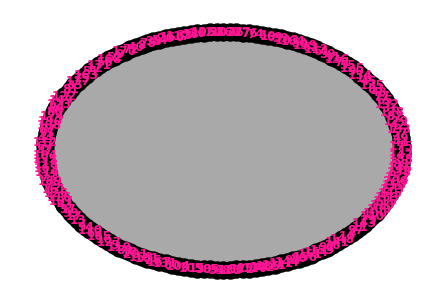

In [48]:
nx.draw_circular(G_stations,
                 with_labels = True, # draw labels on the nodes
                 font_color = 'deeppink', 
                 font_weight = 'bold',
                 node_color = 'black',
                 edge_color = 'darkgray')
plt.rcParams["figure.figsize"] = [30,30] # Run twice to obtain this size
plt.show()  

Obtenemos un grafo dirigido, pero es inmanejable. Cambiamos el formato del plot:

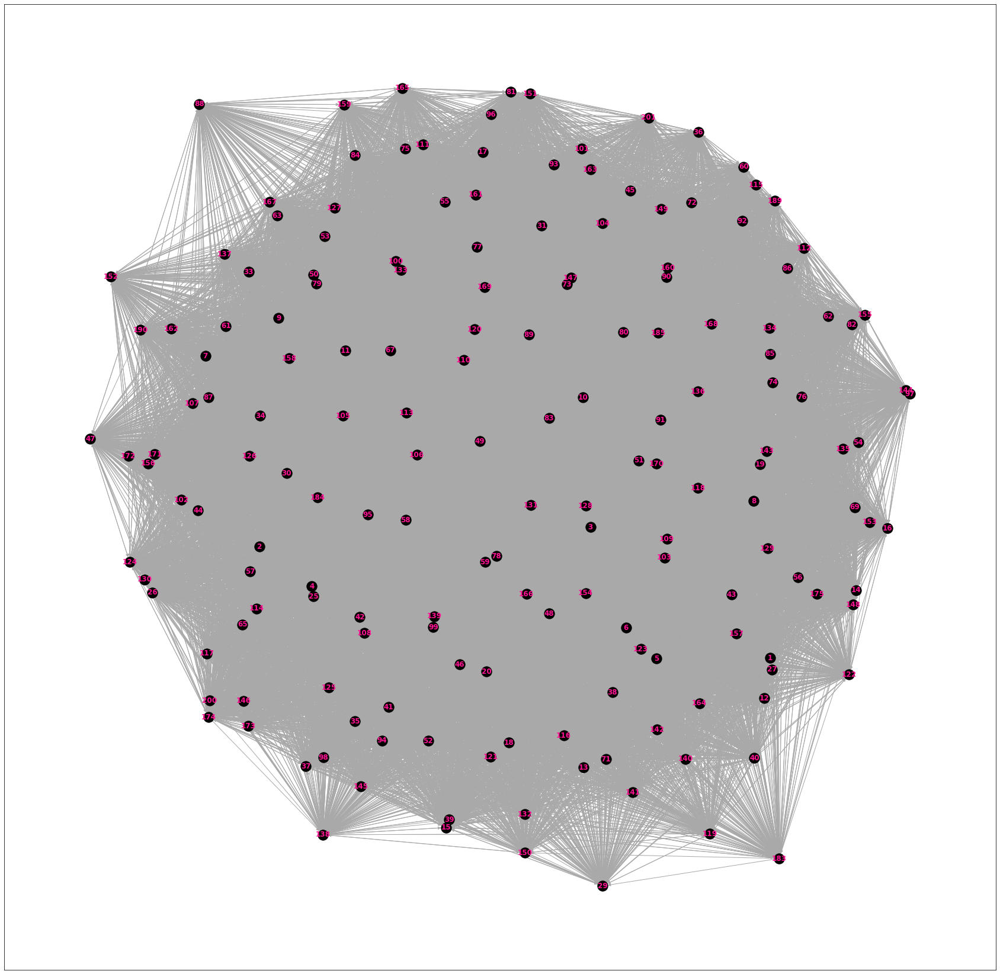

In [49]:
nx.draw_networkx(G_stations,
                 with_labels = True,
                 font_color = 'deeppink',
                 font_weight = 'bold',
                 node_color = 'black',
                 edge_color = 'darkgray')
plt.rcParams["figure.figsize"] = [30,30]
plt.show()  

Visualmente, sólo podemos que se trata de una red, a priori, conexa. Poco más.
Por ello, creamos las siguientes funciones:

`plot_node_as_origin` recibe un nodo como input y plotea todos los viajes que parten de él.

In [50]:
import math

def plot_node_as_origin(station):
  
  if station not in np.unique(df["Source"]):
    raise NameError('INVALID STATION')

  graph = df.loc[df['Source'] == station]


  G_temp = nx.from_pandas_edgelist(graph,
                                   source = 'Source',
                                   target = 'Target',
                                   edge_attr = 'Weight',
                                   create_using=nx.DiGraph())

  labels = nx.get_edge_attributes(G_temp, 'Weight')

  pos = nx.spring_layout(G_temp, k = 12 / math.sqrt(G_temp.order()))
  
  nx.draw(G_temp,
          pos = pos,
          with_labels = True,
          node_size = 700,
          node_color = 'lemonchiffon',
          font_size = 11,
          font_weight='bold',
          edge_color = 'darkgray')
  
  nx.draw_networkx_edge_labels(G_temp, pos = pos, edge_labels = labels)

  plt.rcParams["figure.figsize"] = [14,14]
  plt.show()  

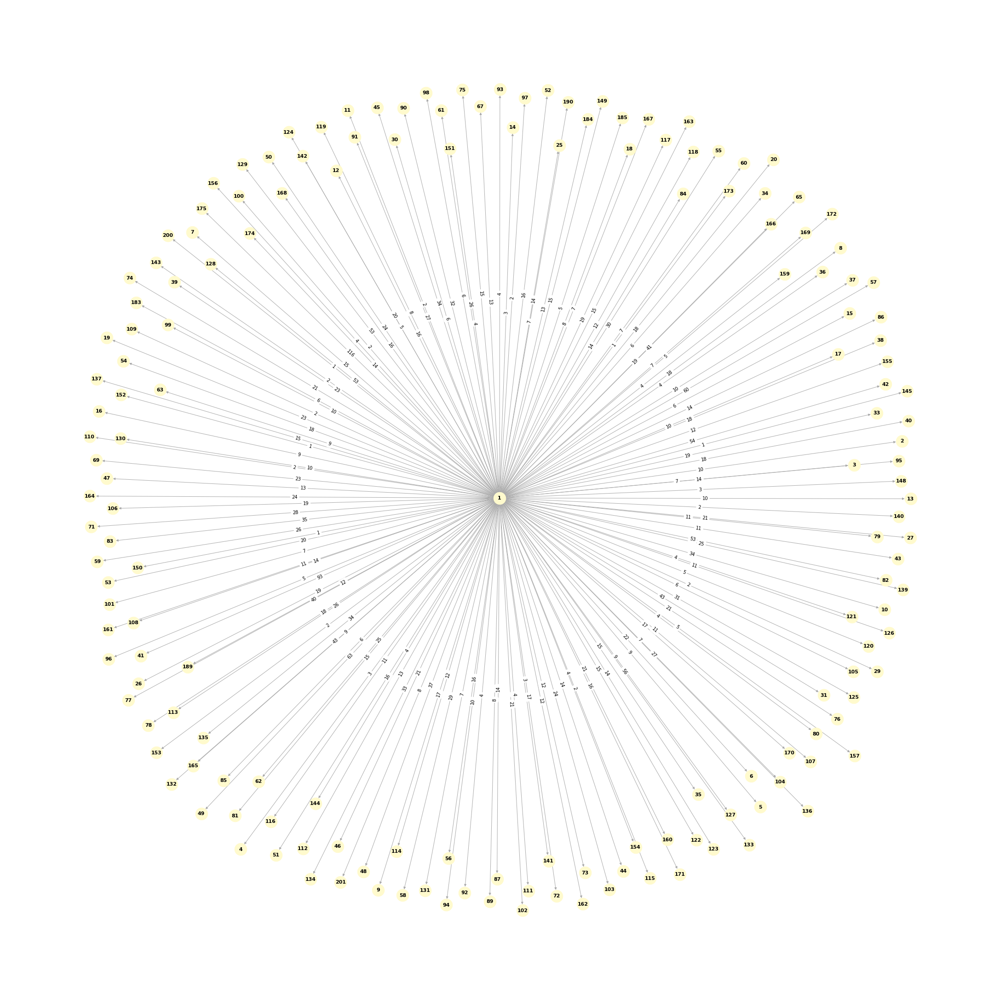

In [51]:
plot_node_as_origin(1)

`plot_node_as_target` recibe un nodo como input y plotea todos los viajes que llegan de él.

In [52]:
def plot_node_as_target(station):

  if station not in np.unique(df["Target"]):
    raise NameError('INVALID STATION')

  graph = df.loc[df['Target'] == station]


  G_temp = nx.from_pandas_edgelist(graph,
                                   source = 'Source',
                                   target = 'Target',
                                   edge_attr = 'Weight',
                                   create_using=nx.DiGraph())

  labels = nx.get_edge_attributes(G_temp, 'Weight')

  pos = nx.spring_layout(G_temp, k= 12/math.sqrt(G_temp.order()))
  nx.draw(G_temp,
          pos = pos,
          with_labels = True,
          node_size = 700,
          node_color = 'lemonchiffon',
          font_size = 11,
          font_weight = 'bold',
          edge_color = 'darkgray') #draw the graph

  nx.draw_networkx_edge_labels(G_temp, pos = pos, edge_labels = labels)

  plt.rcParams["figure.figsize"] = [14,14] #Puede reajustarse el tamaño
  plt.show()  

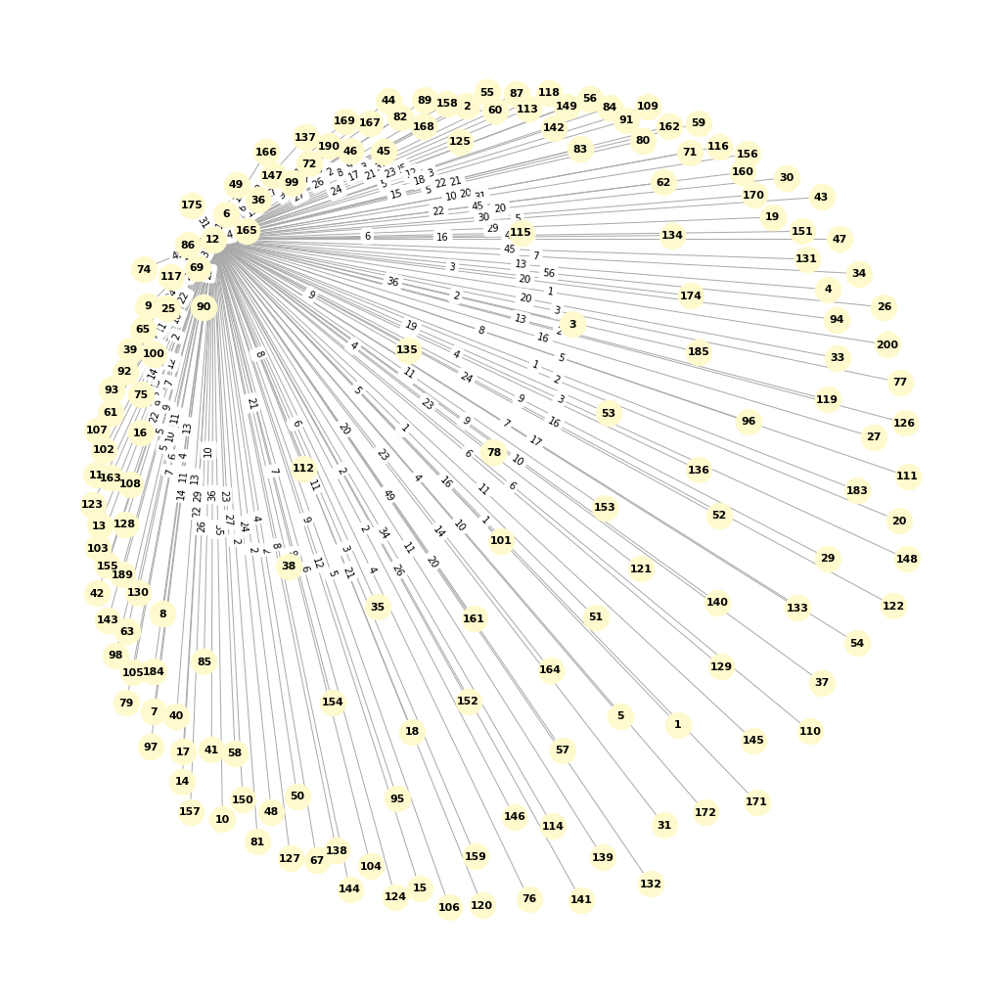

In [53]:
plot_node_as_target(12)

In [54]:
df = df.reset_index(drop=True)
df.head()

,Source,Target,Weight,Source_Barrio,Source_Direccion,Source_Lat,Source_Lon,Target_Barrio,Target_Direccion,Target_Lat,Target_Lon,Weight-Inverse
0,1,175,116,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,02-05 DELICIAS,CALLE DE JAIME EL CONQUISTADOR; 30,40.3962332942252,-3.69830799524925,0.008621
1,1,41,93,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,01-02 EMBAJADORES,CALLE DE ATOCHA; 56,40.4122280999799,-3.69898977972563,0.010753
2,1,49,63,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,01-02 EMBAJADORES,RONDA DE ATOCHA; 36,40.406049872348,-3.69924264482009,0.015873
3,1,57,60,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,01-04 JUSTICIA,CALLE DE SANTA CRUZ DE MARCENADO; 24,40.4296364220195,-3.71281811499328,0.016667
4,1,133,56,01-06 SOL,CALLE DE ALCALA; 2,40.4171107953153,-3.70199802576925,07-05 RÍOS ROSAS,CALLE DE DULCINEA; 3,40.4471674540003,-3.70002920994525,0.017857


In [55]:
source_unique = set(np.unique(df["Source"]))
target_unique = set(np.unique(df["Target"]))
set_unique = source_unique.copy()
set_unique.update(target_unique)

In [56]:
df_stations = df_stations[df_stations["Id"].isin(list(set_unique))].\
                  sort_values(by = "Id").\
                  reset_index(drop=True)
df_stations

,Id,Barrio,Dirección,Lat,Lon
0,1,01-06 SOL,"CALLE DE ALCALA, 2",40.4171107953153,-3.70199802576925
1,2,01-05 UNIVERSIDAD,"CALLE DE MIGUEL MOYA, 1",40.4205801410996,-3.7056738708445
2,3,07-02 ARAPILES,"PLAZA DEL CONDE DEL VALLE DE SUCHIL, 2",40.4303225635761,-3.70721222717123
3,4,01-05 UNIVERSIDAD,"CALLE DE MANUELA MALASAÑA, 3",40.4285905943729,-3.70267393708668
4,5,01-04 JUSTICIA,"CALLE DE FUENCARRAL, 106",40.4283629640739,-3.70207622424503
...,...,...,...,...,...
167,185,04-05 LISTA,"GLORIETA DEL MARQUES DE ZAFRA, 4",40.4250683619825,-3.66153295744438
168,189,04-06 CASTELLANA,"CALLE DE LA VIRGEN DE LA ALEGRIA, 18",40.4351226521444,-3.65551827726975
169,190,04-04 GUINDALERA,"CALLE DE VELAZQUEZ, 91",40.4343751094586,-3.6834686388527
170,200,07-05 RÍOS ROSAS,"GLORIETA DE QUEVEDO, 4",40.4336617785123,-3.70467099810926


Representamos las estaciones disponibles sobre el mapa:

In [57]:
Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)

for x in range(df_stations.shape[0]):
  df_temp = df_stations.iloc[x]
  lat = float(df_temp["Lat"])
  lon = float(df_temp["Lon"])
  loc = [lat, lon]
  
  id = df_temp["Id"]
  neigh = df_temp["Barrio"]
  dir = df_temp["Dirección"]
  
  datos = ("<b>Station number: </b>"+str(id)+""+"\n"+
           "<b>Barrio: </b>"+str(neigh)+""+"\n"+
           "<b>Direccion: </b>"+str(dir))

  folium.Marker(location = loc,
                popup = datos,
                icon = folium.Icon(icon = "fa-bicycle",
                                   prefix = 'fa',
                                   color = "white",
                                   icon_color = "blue")).add_to(Mad)

Mad

Casi todas las estaciones -a junio de 2019- se encontraban en la almendra centras y barrios periféricos -Usera, Campamento, Villaverde...- y no tan periféricos -Ciudad Universitaria, Francos Rodríguez, Valdezarza, Ventas...- no poseen servicio de BiciMAD. Sería interesante ver qué ocurre ahora, pero en aquel entonces BiciMad brillaba por su ausencia en el día a día del transporte.

## MÉTRICAS DE LA RED SOCIAL

### TAMAÑO

Empleamos `number_of_nodes` y `number_of_edges` para obtener el número de nodos y arcos respectivamente:

In [58]:
# Size
print("Number of nodes: %s" % G_stations.number_of_nodes())
print("Number of edges: %s" % G_stations.number_of_edges())

Number of nodes: 172
Number of edges: 27011


### CONEXIÓN

Se dice que un grafo dirigido es débilmente conexo si y solo si el grafo es conexo cuando la dirección de los arcos es ignorada. En nuestro caso, tenemos una red debilmente conexa:

In [59]:
nx.is_weakly_connected(G_stations)

True

Se dice que un grado dirigido es fuertemente conexo si para cada par de vértices $u$ y $v$ existe un camino de $u$ hacia $v$ y un camino de $v$ hacia $u$. En nuestro caso, tenemos una red fuertemente conexa:

In [60]:
nx.is_strongly_connected(G_stations)

True

### DIÁMETRO

Mediante `diameter`, calculamos el diámetro del grafo. El diámetro de define como la excentricidad máxima, es decir:
$$max\{d(u,v) | u,v\in V\}$$



In [61]:
# Diameter
diameter = nx.diameter(G_stations)
print("Diameter for directed network: %s" % diameter)

Diameter for directed network: 2


Tiene sentido esta métrica en nstra red? No, al menos tal y como la calcula networkx, que lo hace considerando todos los arcos con peso 1. No permite indicar el peso con el que valorar los arcos.

### DEGREES

El grado de un nodo se define como el numero de arcos -de salida y entrada- que confluyen -salen o llegan- a un nodo. Empleamos `degree` para calcular el grado de cada nodo. Establecemos `weights=None` para que no tenga en cuenta los pesos y no trate a la red como un grafo valorado. En realidad, podríamos ahorrarnos este argumento porque es la opción por defecto.


Supongamos un grafo dirigido y valorado $G$ con dos nodos -estaciones- SOL y NUEVOS MINISTERIOS. Supongamos que sólo hay un arco de SOL a NUEVOS MINISTERIOS con un peso de 5. Al computar el degreee de SOL, diremos que tiene degree 1. Al computar el degree de NUEVOS MINISTERIOS, diremos que tiene degree 1. Emplearemos el grafo $G$ para ilustrar otras medidas. 

In [62]:
# Degree
degree = dict(G_stations.degree(weight = None))
degree_df = pd.DataFrame(degree, index = [0]).transpose().sort_index()
degree_df.columns = ["Degree"]

Obtenemos un dataframe en el que el índice se corresponde con el identificador de la estación y la columna con el degree. El proceso será similar en el resto de medidas relacionadas con el degree.

In [63]:
degree_df.head()

,Degree
1,335
2,319
3,338
4,329
5,317


Podemos crear un histograma para ver la distribución.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e1cf56110>]],
      dtype=object)

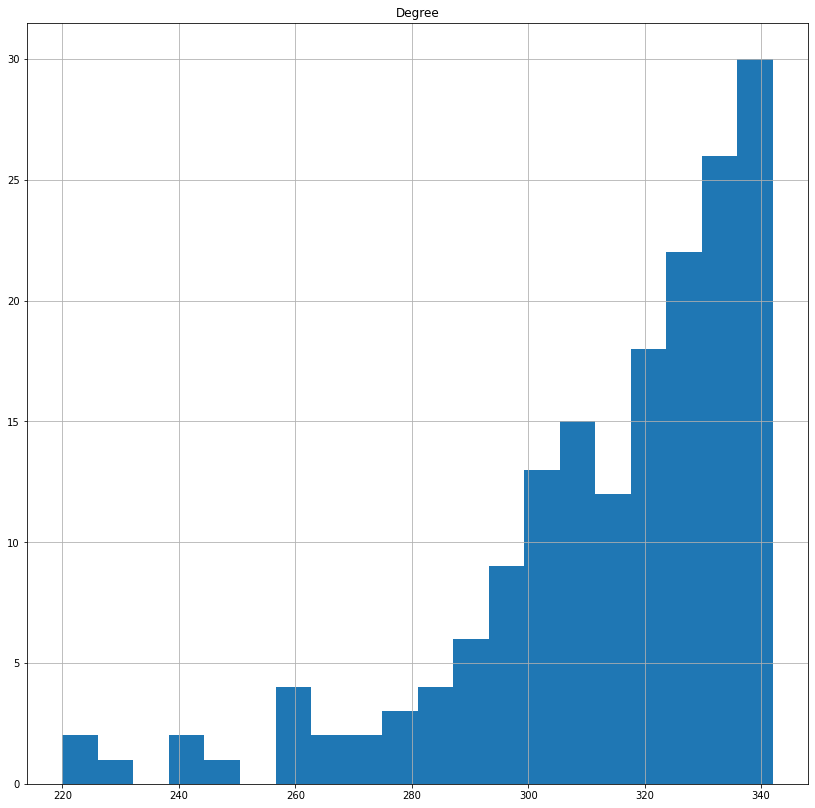

In [64]:
degree_df.hist(bins = 20)

Podemos representar los resultados sobre un grafo. El color de los nodos y el tamaño se identifica con el grado de dicho nodo. Cuando más oscuro y mayor es el nodo, mayor es el grado:

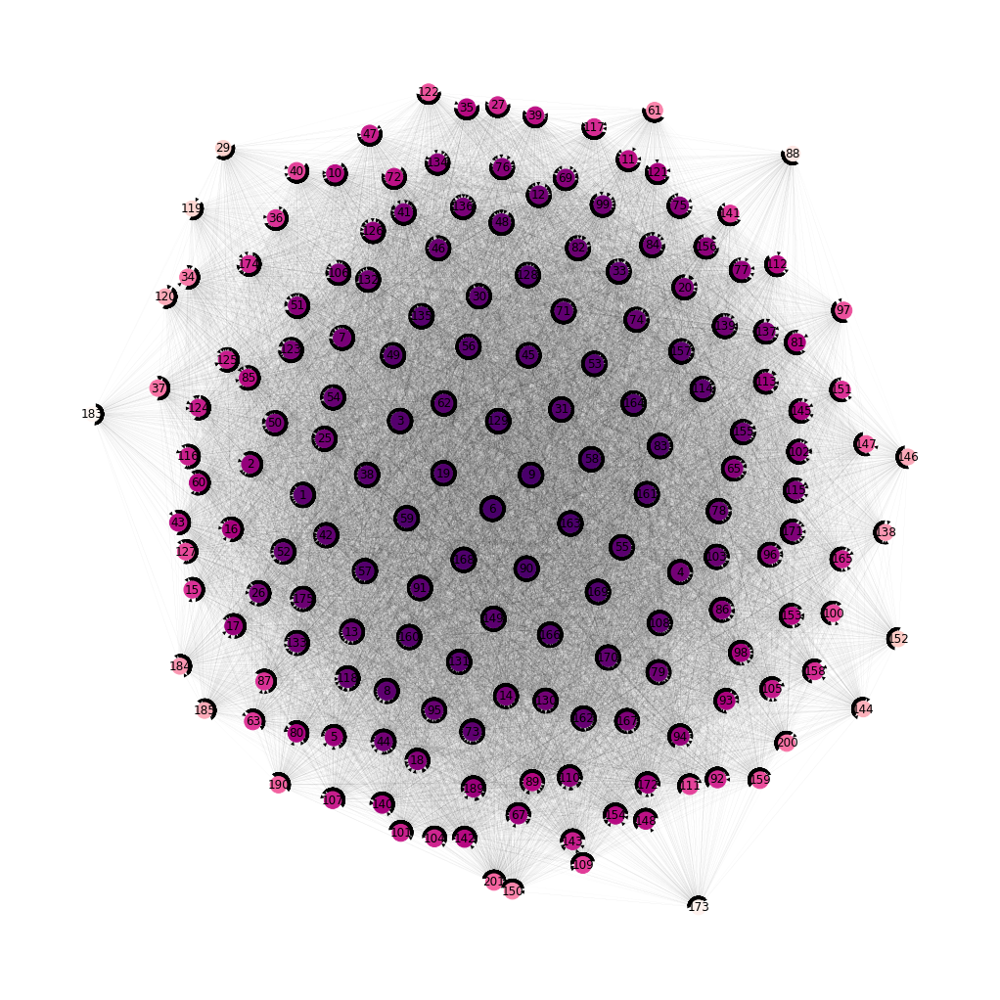

In [65]:
centrality = np.fromiter(degree.values(), float)
# plot
pos = nx.kamada_kawai_layout(G_stations)
nx.draw(G_stations, pos,
        node_color=centrality,
        node_size=centrality,
        cmap = "RdPu",
        width = 0.01)
nx.draw_networkx_labels(G_stations, pos)
plt.show()

¿Podríamos intuir la conexión de la red a partir del grafo? Recordemos, tenemos un total de 172 nodos. El doble son 344. Observaomo que la mayoría de los nodos tienen un grado superior a 300. De hehco, la mayoría se encuentra en el último bin del histograma, luego es de esperar que sea bastante conexa.

Puesto que tenemos un grafo valorado, podemos calcular el degree valorado. Es por ello que hacemos `weight="Weights"` para indicar cómo valorar la red.

En el grafo $G$ del ejemplo anterior, el degree valorado de SOL sería 5 y el degree valorado de NUEVOS MINISTERIOS sería 5. Es como si contásemos un arco tantas veces como indique su peso. 

In [66]:
# Weighted Degree
degree_weighted = dict(G_stations.degree(weight = "Weight"))
degree_weighted_df = pd.DataFrame(degree_weighted, index = [0]).transpose().sort_index()
degree_weighted_df.columns = ["Degree-Weighted"]

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e1cf00c50>]],
      dtype=object)

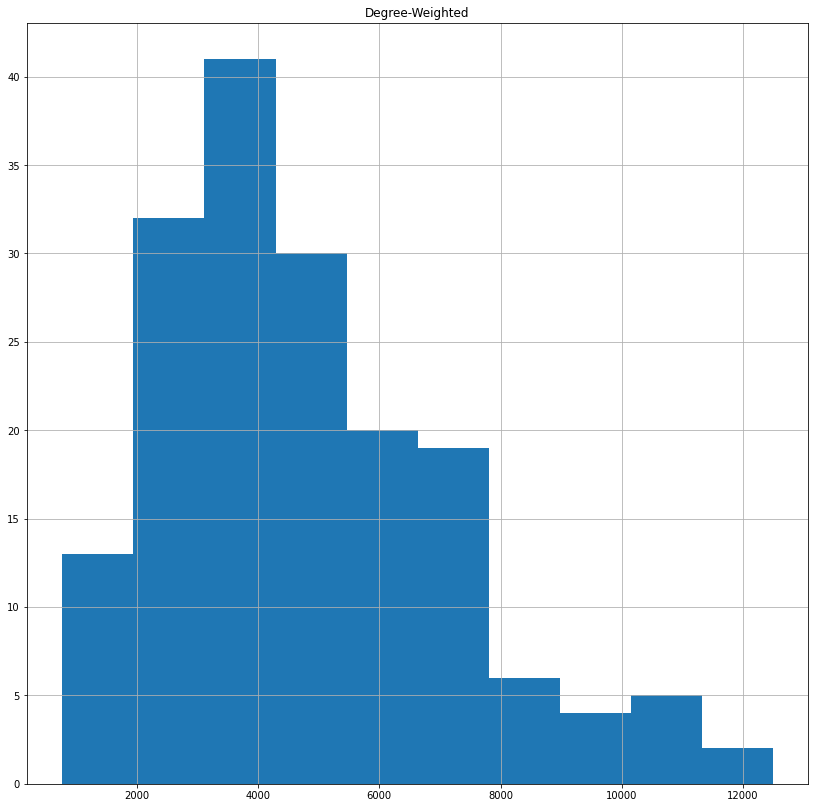

In [67]:
degree_weighted_df.hist()

El grado de entrada de un nodo se define como el número de arcos que llegan a dicho nodo.

En el ejemplo del grafo $G$, el nodo NUEVOS MINISTERIOS tendría un in-degree de 1 y el nodo SOL tendría un in-degree de 0.

In [68]:
# In-Degree
degree_in = dict(G_stations.in_degree())
degree_in_df = pd.DataFrame(degree_in, index = [0]).transpose().sort_index()
degree_in_df.columns = ["In-Degree"]

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e1e96d910>]],
      dtype=object)

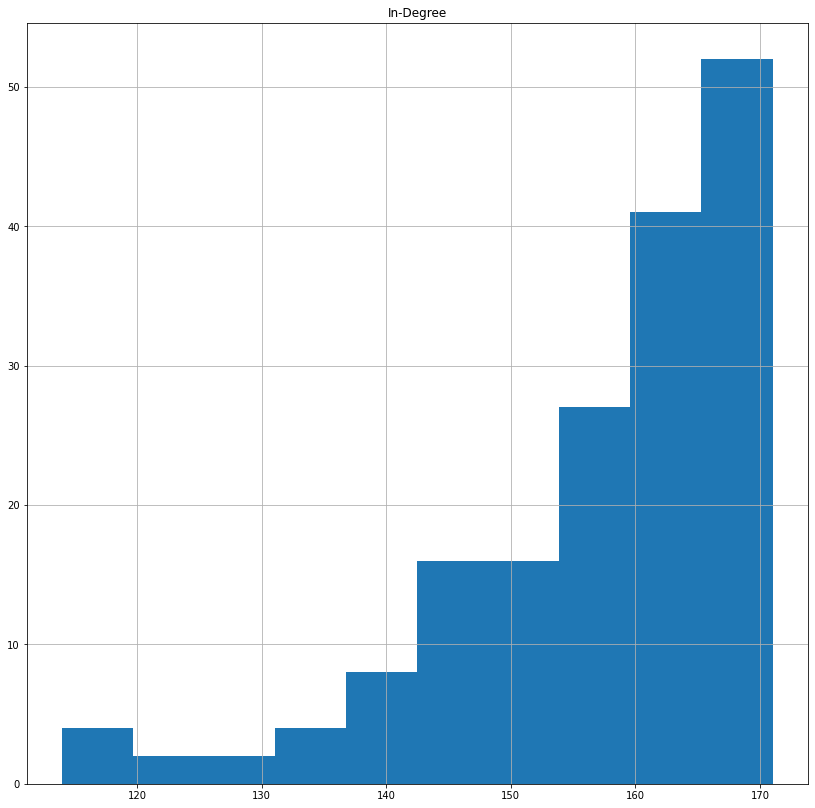

In [69]:
degree_in_df.hist()

De manera similar a la anterior, podemos definir el in-degree valorado contando un arco tantas veces como indique su peso.

En el grafo de ejemplo $G$, el nodo NUEVOS MINISTERIOS tendría un in-degree valorado de 5 y el nodo SOL tendría un in-degree valorado de 0.

In [70]:
# Weighted in degree
degree_in_weighted = dict(G_stations.in_degree(weight = "Weight"))
degree_in_weighted_df = pd.DataFrame(degree_in_weighted, index = [0]).transpose().sort_index()
degree_in_weighted_df.columns = ["In-Degree-Weighted"]

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e1e837210>]],
      dtype=object)

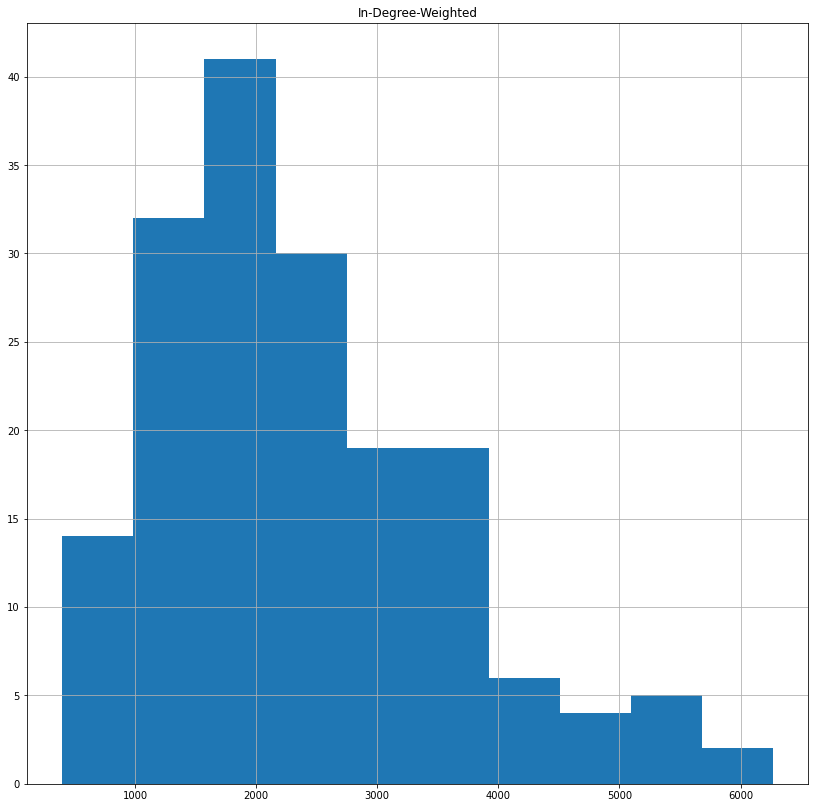

In [71]:
degree_in_weighted_df.hist()

Cuanto mayor y más oscuro es el nodo, mayor es el in-degree valorado:

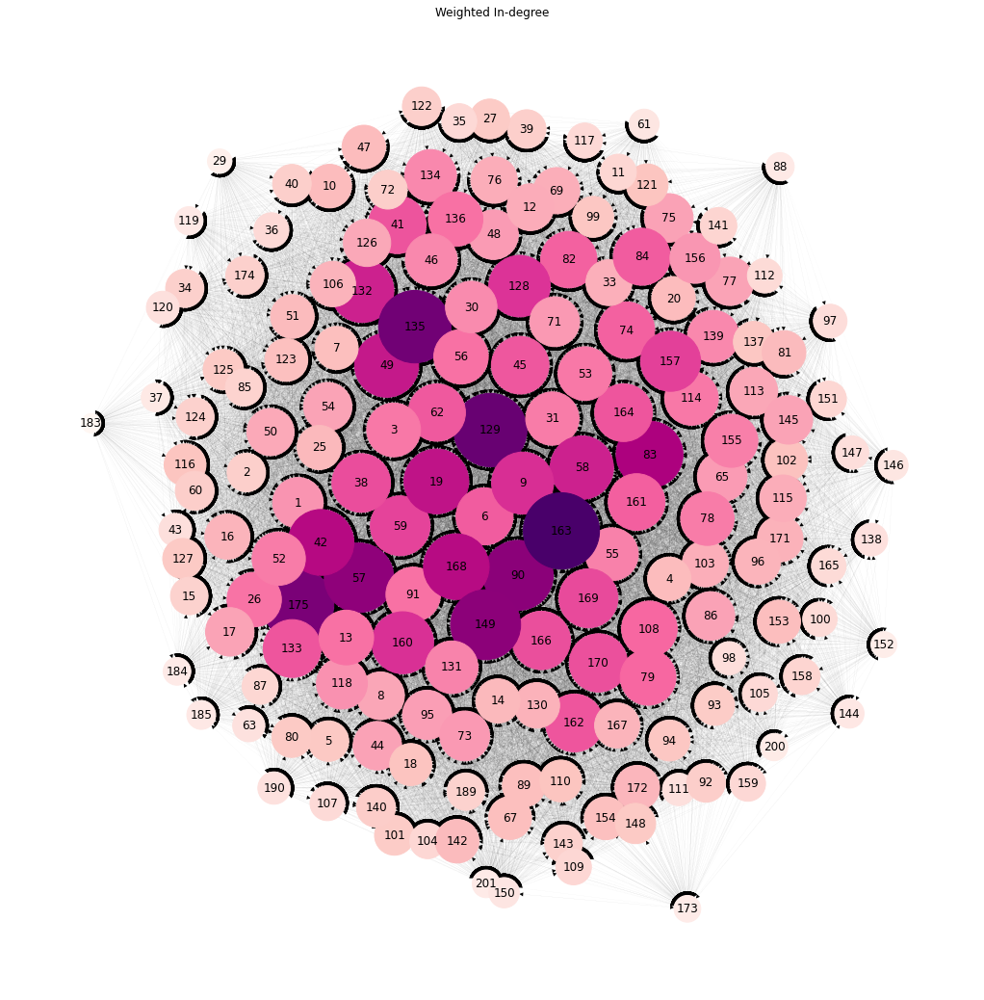

In [72]:
centrality = np.fromiter(degree_in_weighted.values(), float)
# plot
pos = nx.kamada_kawai_layout(G_stations)
nx.draw(G_stations, pos,
        node_color=centrality,
        node_size=centrality,
        cmap = "RdPu",
        width = 0.01)
nx.draw_networkx_labels(G_stations, pos)
plt.title("Weighted In-degree")
plt.show()

Vamos a seleccionar los nodos cuyo in-degree valorado esté por debajo del percentil 10:

In [73]:
worst_in_weighted = degree_in_weighted_df[degree_in_weighted_df["In-Degree-Weighted"] < degree_in_weighted_df["In-Degree-Weighted"].quantile(.1)]
worst_in_weighted = worst_in_weighted.reset_index().\
                      rename(columns = {"index" : "Id"})
worst_in_weighted = pd.merge(worst_in_weighted, df_stations, on ="Id", how = "left")
worst_in_weighted["Label"] = "worst"
worst_in_weighted.sort_values(by = "In-Degree-Weighted")

,Id,In-Degree-Weighted,Barrio,Dirección,Lat,Lon,Label
12,183,401,04-03 FUENTE DEL BERRO,"CALLE DE HERMOSILLA, 135",40.4256359410288,-3.66945062094213,worst
0,29,643,01-01 PALACIO,"CALLE DEL MARQUES DE CUBAS, 25",40.416244109804,-3.69580079339477,worst
10,152,724,06-02 CUATRO CAMINOS,"AVENIDA DEL GENERAL PERON, S/N",40.4527164088074,-3.69894968717916,worst
11,173,769,02-02 ACACIAS,"PASEO DE LA ESPERANZA, 59",40.3981758743262,-3.70236151429629,worst
16,200,802,07-05 RÍOS ROSAS,"GLORIETA DE QUEVEDO, 4",40.4336617785123,-3.70467099810926,worst
17,201,824,07-06 VALLEHERMOSO,"CALLE DE JOSE ABASCAL, frente al 2",40.4387323940721,-3.70381604764219,worst
13,184,826,04-03 FUENTE DEL BERRO,"PASEO DEL MARQUES DE ZAFRA, 24",40.4260024599175,-3.66530950600264,worst
4,88,853,04-02 GOYA,"CALLE DE VELAZQUEZ, 73",40.4312078719674,-3.68374710672573,worst
6,119,858,02-06 PALOS DE MOGUER,"CALLE DE MENDEZ ALVARO, 7",40.4014568219022,-3.68657767589888,worst
1,37,869,01-01 PALACIO,"PLAZA DE SAN FRANCISCO, 5",40.4108607472815,-3.7141233769735,worst


Vamos a seleccionar los nodos cuyo in-degree valorado esté por encima del percentil 90.

In [74]:
best_in_weighted = degree_in_weighted_df[degree_in_weighted_df["In-Degree-Weighted"] > degree_in_weighted_df["In-Degree-Weighted"].quantile(.90)]
best_in_weighted = best_in_weighted.reset_index().\
                      rename(columns = {"index" : "Id"})
best_in_weighted = pd.merge(best_in_weighted, df_stations, on ="Id", how = "left")
best_in_weighted["Label"] = "best"
best_in_weighted.sort_values(by = "In-Degree-Weighted")

,Id,In-Degree-Weighted,Barrio,Dirección,Lat,Lon,Label
13,157,3884,05-04 HISPANOAMÉRICA,"PASEO DE LA CASTELLANA, S/N",40.4592820835376,-3.68933052390666,best
8,128,4081,07-01 GAZTAMBIDE,"CALLE DE CEA BERMUDEZ, 59",40.4390414696922,-3.71558889392933,best
14,160,4134,09-01 CASA DE CAMPO,"CALLE DE COLOMBIA, 7",40.4571888259995,-3.67654067670693,best
0,9,4148,01-01 PALACIO,"PLAZA DE SAN MIGUEL, 9",40.4156134806993,-3.70940929938434,best
10,132,4330,06-02 CUATRO CAMINOS,"CALLE DE SANTA ENGRACIA, 168",40.4463890735351,-3.70359108458389,best
5,58,4338,01-05 UNIVERSIDAD,"CALLE DE AUGUSTO FIGUEROA, 33",40.422258617772,-3.69794108992409,best
3,49,4433,01-02 EMBAJADORES,"RONDA DE ATOCHA, 36",40.406049872348,-3.69924264482009,best
1,19,4527,01-04 JUSTICIA,"CALLE DE PRIM, 4",40.421902428886,-3.69539476751156,best
16,168,4661,02-02 ACACIAS,"PASEO DE SANTA MARIA DE LA CABEZA, 32",40.4045829072803,-3.69591592521647,best
2,42,4682,01-02 EMBAJADORES,"CALLE DE SANTA ISABEL, 32",40.410744084974,-3.69820680839403,best


Unificamos ambos datframes:

In [75]:
my_df_in = pd.concat([best_in_weighted, worst_in_weighted])
my_df_in

,Id,In-Degree-Weighted,Barrio,Dirección,Lat,Lon,Label
0,9,4148,01-01 PALACIO,"PLAZA DE SAN MIGUEL, 9",40.4156134806993,-3.70940929938434,best
1,19,4527,01-04 JUSTICIA,"CALLE DE PRIM, 4",40.421902428886,-3.69539476751156,best
2,42,4682,01-02 EMBAJADORES,"CALLE DE SANTA ISABEL, 32",40.410744084974,-3.69820680839403,best
3,49,4433,01-02 EMBAJADORES,"RONDA DE ATOCHA, 36",40.406049872348,-3.69924264482009,best
4,57,5213,01-04 JUSTICIA,"CALLE DE SANTA CRUZ DE MARCENADO, 24",40.4296364220195,-3.71281811499328,best
5,58,4338,01-05 UNIVERSIDAD,"CALLE DE AUGUSTO FIGUEROA, 33",40.422258617772,-3.69794108992409,best
6,83,4808,03-02 ADELFAS,"CALLE DE PIO BAROJA, 8 B",40.4132590448197,-3.67453386290371,best
7,90,5283,04-01 RECOLETOS,"CALLE DE GOYA, 18",40.4250879599628,-3.6837296911372,best
8,128,4081,07-01 GAZTAMBIDE,"CALLE DE CEA BERMUDEZ, 59",40.4390414696922,-3.71558889392933,best
9,129,5805,07-05 RÍOS ROSAS,"CALLE DE JOSE ABASCAL, 33",40.4384681956916,-3.69828378445489,best


Representamos las estaciones obtenidas sobre un mapa pare ver si pobtenemos alguna conclusión relativa a su distribución espacial. En rojo, las estaciones cuyo in-degree valorado está por debajo del percentil 10. En verde, las estaciones cuyo in-degree valorado está por encima del percentil 90.

In [76]:
Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)

for x in range(my_df_in.shape[0]):
  
  lat = float(my_df_in.iloc[x,4])
  lon = float(my_df_in.iloc[x,5])
  loc = [lat, lon]

  neigh = my_df_in.iloc[x,2]

  datos = "<b>Station number: </b>"+str(my_df_in.iloc[x,0])

  adress = my_df_in.iloc[x,3]
  
  if  my_df_in.iloc[x,6] == "best":
    col = "green"
  else:
    col = "red"
  
  folium.Marker(location = loc,
                  popup = datos,
                  tooltip = adress,
                  icon = folium.Icon(icon = "fa-bicycle",
                                     prefix = 'fa',
                                     color = "white",
                                     icon_color = col)).add_to(Mad)

Mad

El out-degree de un nodo se define como el número de arcos que parten de dicho nodo.

En el ejemplo del grafo $G$, el nodo NUEVOS MINISTERIOS tendría un out-degree de 0 y el nodo SOL tendría un out-degree de 1.

In [77]:
# Out-Degree
degree_out = dict(G_stations.out_degree())
degree_out_df = pd.DataFrame(degree_out, index = [0]).transpose().sort_index()
degree_out_df.columns = ["Out-Degree"]

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e18ff7890>]],
      dtype=object)

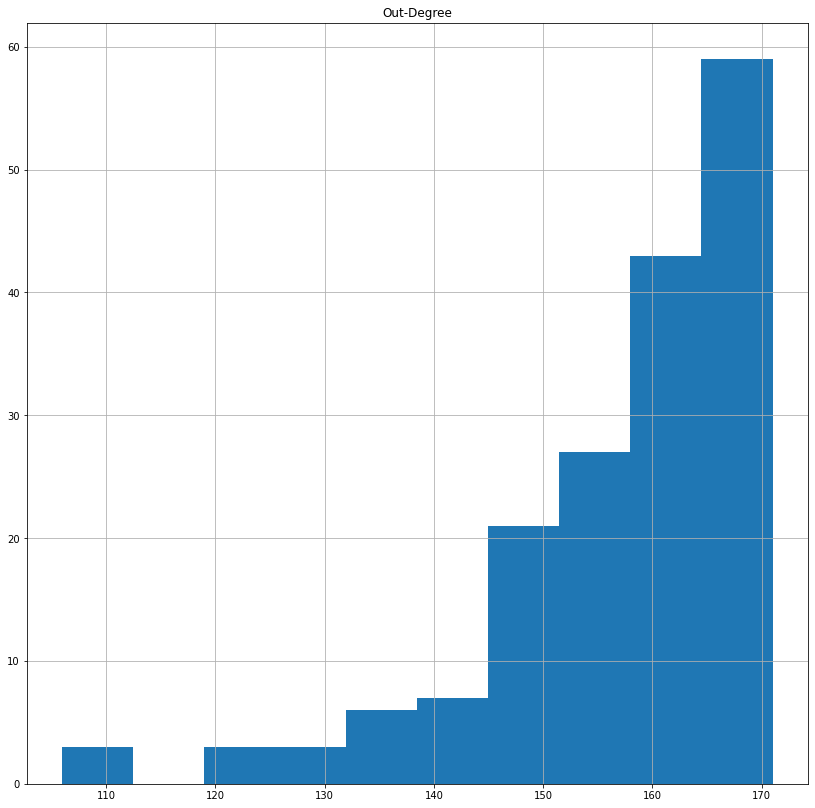

In [78]:
degree_out_df.hist()

EL out-degree valorado ee define de manera análoga.

Para el grafo de ejemplo $G$, el nodo NUEVOS MINISTERIOS tendría un out-degree valorado de 0 y el nodo SOL tendría un out-degree valorado de 5.

In [79]:
# Weighted out-degree
degree_out_weighted = dict(G_stations.out_degree(weight = "Weight"))
degree_out_weighted_df = pd.DataFrame(degree_out_weighted, index = [0]).transpose().sort_index()
degree_out_weighted_df.columns = ["Out-Degree-Weighted"]

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e1a33a250>]],
      dtype=object)

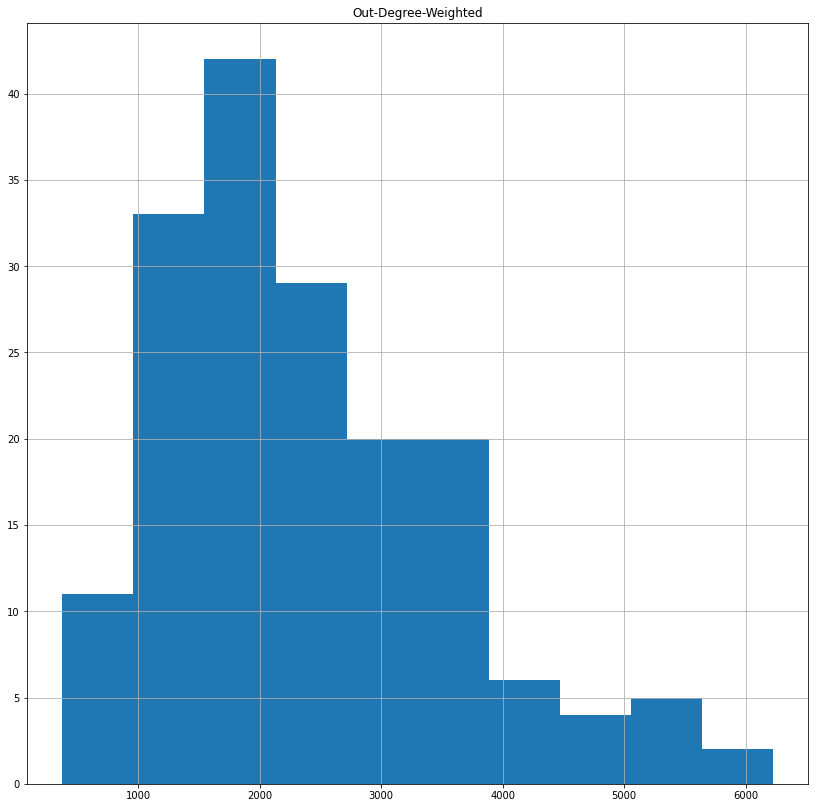

In [80]:
degree_out_weighted_df.hist()

Cuanto más oscuro y mayor es el nodo, mayor es el out-degree valorado:

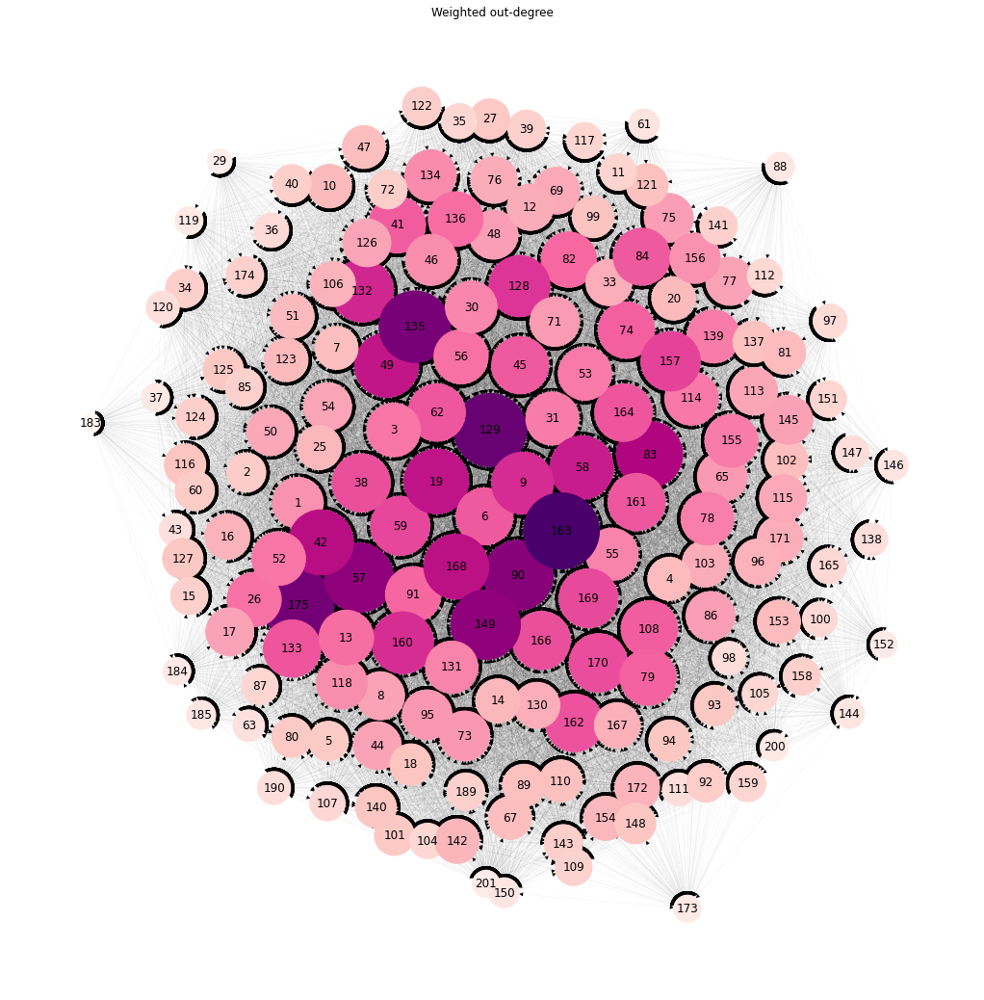

In [81]:
centrality = np.fromiter(degree_out_weighted.values(), float)
# plot
pos = nx.kamada_kawai_layout(G_stations)
nx.draw(G_stations, pos,
        node_color=centrality,
        node_size=centrality,
        cmap = "RdPu",
        width = 0.01)
nx.draw_networkx_labels(G_stations, pos)
plt.title("Weighted out-degree")
plt.show()

Volvemos a pintar sobre un mapa las esatciones con un out-degree valorado por debajo del percentil 10 y por encima del percentil 90.

In [82]:
worst_out_weighted = degree_out_weighted_df[degree_out_weighted_df["Out-Degree-Weighted"] < degree_out_weighted_df["Out-Degree-Weighted"].quantile(.1)]
worst_out_weighted = worst_out_weighted.reset_index().\
                      rename(columns = {"index" : "Id"})
worst_out_weighted = pd.merge(worst_out_weighted, df_stations, on ="Id", how = "left")
worst_out_weighted["Label"] = "worst"
worst_out_weighted.sort_values(by = "Out-Degree-Weighted")

,Id,Out-Degree-Weighted,Barrio,Dirección,Lat,Lon,Label
13,183,375,04-03 FUENTE DEL BERRO,"CALLE DE HERMOSILLA, 135",40.4256359410288,-3.66945062094213,worst
0,29,652,01-01 PALACIO,"CALLE DEL MARQUES DE CUBAS, 25",40.416244109804,-3.69580079339477,worst
11,152,769,06-02 CUATRO CAMINOS,"AVENIDA DEL GENERAL PERON, S/N",40.4527164088074,-3.69894968717916,worst
17,201,797,07-06 VALLEHERMOSO,"CALLE DE JOSE ABASCAL, frente al 2",40.4387323940721,-3.70381604764219,worst
12,173,803,02-02 ACACIAS,"PASEO DE LA ESPERANZA, 59",40.3981758743262,-3.70236151429629,worst
14,184,824,04-03 FUENTE DEL BERRO,"PASEO DEL MARQUES DE ZAFRA, 24",40.4260024599175,-3.66530950600264,worst
16,200,835,07-05 RÍOS ROSAS,"GLORIETA DE QUEVEDO, 4",40.4336617785123,-3.70467099810926,worst
7,119,849,02-06 PALOS DE MOGUER,"CALLE DE MENDEZ ALVARO, 7",40.4014568219022,-3.68657767589888,worst
1,37,854,01-01 PALACIO,"PLAZA DE SAN FRANCISCO, 5",40.4108607472815,-3.7141233769735,worst
5,88,894,04-02 GOYA,"CALLE DE VELAZQUEZ, 73",40.4312078719674,-3.68374710672573,worst


In [83]:
best_out_weighted = degree_out_weighted_df[degree_out_weighted_df["Out-Degree-Weighted"] > degree_out_weighted_df["Out-Degree-Weighted"].quantile(.90)]
best_out_weighted = best_out_weighted.reset_index().\
                      rename(columns = {"index" : "Id"})
best_out_weighted = pd.merge(best_out_weighted, df_stations, on ="Id", how = "left")
best_out_weighted["Label"] = "best"
best_out_weighted.sort_values(by = "Out-Degree-Weighted")

,Id,Out-Degree-Weighted,Barrio,Dirección,Lat,Lon,Label
13,157,3815,05-04 HISPANOAMÉRICA,"PASEO DE LA CASTELLANA, S/N",40.4592820835376,-3.68933052390666,best
8,128,4026,07-01 GAZTAMBIDE,"CALLE DE CEA BERMUDEZ, 59",40.4390414696922,-3.71558889392933,best
14,160,4129,09-01 CASA DE CAMPO,"CALLE DE COLOMBIA, 7",40.4571888259995,-3.67654067670693,best
0,9,4147,01-01 PALACIO,"PLAZA DE SAN MIGUEL, 9",40.4156134806993,-3.70940929938434,best
10,132,4217,06-02 CUATRO CAMINOS,"CALLE DE SANTA ENGRACIA, 168",40.4463890735351,-3.70359108458389,best
5,58,4357,01-05 UNIVERSIDAD,"CALLE DE AUGUSTO FIGUEROA, 33",40.422258617772,-3.69794108992409,best
3,49,4450,01-02 EMBAJADORES,"RONDA DE ATOCHA, 36",40.406049872348,-3.69924264482009,best
1,19,4509,01-04 JUSTICIA,"CALLE DE PRIM, 4",40.421902428886,-3.69539476751156,best
16,168,4555,02-02 ACACIAS,"PASEO DE SANTA MARIA DE LA CABEZA, 32",40.4045829072803,-3.69591592521647,best
2,42,4580,01-02 EMBAJADORES,"CALLE DE SANTA ISABEL, 32",40.410744084974,-3.69820680839403,best


In [84]:
my_df_out = pd.concat([best_out_weighted, worst_out_weighted])
my_df_out

,Id,Out-Degree-Weighted,Barrio,Dirección,Lat,Lon,Label
0,9,4147,01-01 PALACIO,"PLAZA DE SAN MIGUEL, 9",40.4156134806993,-3.70940929938434,best
1,19,4509,01-04 JUSTICIA,"CALLE DE PRIM, 4",40.421902428886,-3.69539476751156,best
2,42,4580,01-02 EMBAJADORES,"CALLE DE SANTA ISABEL, 32",40.410744084974,-3.69820680839403,best
3,49,4450,01-02 EMBAJADORES,"RONDA DE ATOCHA, 36",40.406049872348,-3.69924264482009,best
4,57,5189,01-04 JUSTICIA,"CALLE DE SANTA CRUZ DE MARCENADO, 24",40.4296364220195,-3.71281811499328,best
5,58,4357,01-05 UNIVERSIDAD,"CALLE DE AUGUSTO FIGUEROA, 33",40.422258617772,-3.69794108992409,best
6,83,4715,03-02 ADELFAS,"CALLE DE PIO BAROJA, 8 B",40.4132590448197,-3.67453386290371,best
7,90,5289,04-01 RECOLETOS,"CALLE DE GOYA, 18",40.4250879599628,-3.6837296911372,best
8,128,4026,07-01 GAZTAMBIDE,"CALLE DE CEA BERMUDEZ, 59",40.4390414696922,-3.71558889392933,best
9,129,5756,07-05 RÍOS ROSAS,"CALLE DE JOSE ABASCAL, 33",40.4384681956916,-3.69828378445489,best


In [85]:
Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)

for x in range(my_df_out.shape[0]):
  
  lat = float(my_df_out.iloc[x,4])
  lon = float(my_df_out.iloc[x,5])
  loc = [lat, lon]

  neigh = my_df_in.iloc[x,2]
  
  datos = "<b>Station number: </b>"+str(my_df_out.iloc[x,0])

  adress = my_df_out.iloc[x,3]
  
  if  my_df_out.iloc[x,6] == "best":
    col = "green"
  else:
    col = "red"
  
  folium.Marker(location = loc,
                  popup = datos,
                  tooltip = adress,
                  icon = folium.Icon(icon = "fa-bicycle",
                                     prefix = 'fa',
                                     color = "white",
                                     icon_color = col)).add_to(Mad)

Mad

Combinamos todas las medidas relativas al degree en un único dataframe:

In [86]:
degrees_df = pd.concat([degree_df, degree_weighted_df,
                        degree_in_df, degree_in_weighted_df,
                        degree_out_df, degree_out_weighted_df], axis = 1).\
                        sort_index()
degrees_df.head(10)

,Degree,Degree-Weighted,In-Degree,In-Degree-Weighted,Out-Degree,Out-Degree-Weighted
1,335,5514,169,2746,166,2768
2,319,3229,159,1593,160,1636
3,338,6212,169,3118,169,3094
4,329,4027,165,2030,164,1997
5,317,3467,155,1770,162,1697
6,342,7022,171,3515,171,3507
7,327,3984,162,2003,165,1981
8,335,4961,167,2464,168,2497
9,342,8295,171,4148,171,4147
10,308,4076,151,2044,157,2032


El índice está represnetando el Id de la estación. Podemos mostrarlo explícitamente en una columna:

In [87]:
degrees_df = degrees_df.reset_index()
degrees_df = degrees_df.rename(columns = {"index" : "Id"})
degrees_df

,Id,Degree,Degree-Weighted,In-Degree,In-Degree-Weighted,Out-Degree,Out-Degree-Weighted
0,1,335,5514,169,2746,166,2768
1,2,319,3229,159,1593,160,1636
2,3,338,6212,169,3118,169,3094
3,4,329,4027,165,2030,164,1997
4,5,317,3467,155,1770,162,1697
...,...,...,...,...,...,...,...
167,185,261,1799,133,898,128,901
168,189,317,3014,162,1505,155,1509
169,190,283,2300,139,1127,144,1173
170,200,278,1637,140,802,138,835


Calculamos el valor medio de las medidas hasta ahora consideradas.

In [88]:
# Average degree
degree_avg = np.average(list(degree.values()))
degree_avg

314.0813953488372

In [89]:
# Average weighted degree
degree_weighted_avg = np.average(list(degree_weighted.values()))
degree_weighted_avg

4791.441860465116

In [90]:
# Average in-degree
degree_in_avg = np.average(list(degree_in.values()))
degree_in_avg

157.0406976744186

In [91]:
# Average weighted in-degree
degree_in_weighted_avg = np.average(list(degree_in_weighted.values()))
degree_in_weighted_avg

2395.720930232558

In [92]:
# Average out-degree
degree_out_avg = np.average(list(degree_out.values()))
degree_out_avg 

157.0406976744186

In [93]:
# Average out-degree
degree_out_weighted_avg = np.average(list(degree_out_weighted.values()))
degree_out_weighted_avg

2395.720930232558

### CLOSENEESS



A grandes rasgos, el closeness de se define como la inversa de su farness, es decir, la inversa de la suma de sus distancias a otros nodos.

El objetivo de esta métrica es identificar los nodos que pueden alcanzar facilmente al resto. 

Sea el grafo $G=(V,E)$ donde $V$ es el conjunto de nodos y $E$ es el conjunto de arcos. Supongamos que el grafo tiene $N$ nodos.

El closeness centality de un nodo $u$ es el inverso de la suma de la longitud los caminos más cortos desde $u$ a los $N-1$ nodos restantes que componen el grafo. Puesto que la suma de las distancias depende del número de nodos, se normaliza mediante:
$$C(u) = \frac{N-1}{\sum_{v=1}^{N-1}d(v,u)}$$
siendo $d(u,v)$ la distancia del camino más corto entre $v$ y $u$ y $N$ el número de nodos del grafo.

Cuánto mayor sea el closeness, mayor será la centralidad

Es por ello que necesitamos la columna "Weights-Inverse". En nuestra red, los pesos de los arcos se corresponden con el número de viajes entre el nodo origen y el nodo destino de modo que tienen una connotación positiva. Podemos intuir que cuantos más viajes haya entre dos nodos, más "cerca" estarán -independientemente de su cercanía real geográfica-. 


Empleamos el argumento `distance = "Weight-Inverse" par aindicar que use esa columna como distancia entre los nodos, es decir, como peso de los arcos. 

In [94]:
# Closeness
closeness = dict(nx.closeness_centrality(G_stations,
                                         distance = "Weight-Inverse"))

Reflejamos los resultados en un histograma:

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e21896f10>]],
      dtype=object)

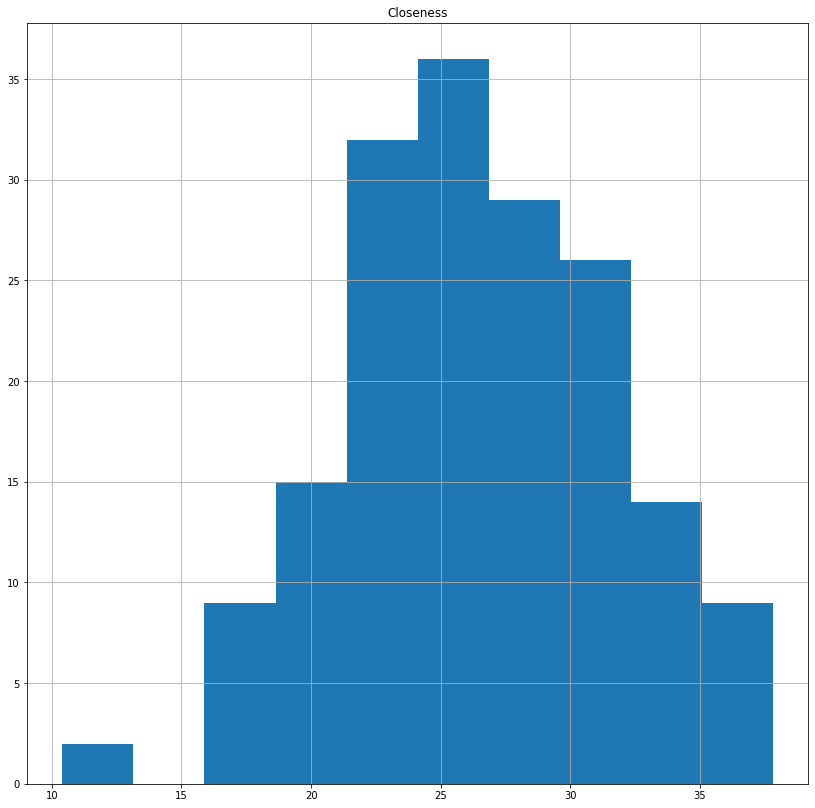

In [95]:
# Histogram for closeness
closeness_df = pd.DataFrame(closeness, index = [0]).transpose().sort_index()
closeness_df.columns = ["Closeness"]
closeness_df.hist()

Recogemos en un dataframe:

In [96]:
# Dataframe proper format. Display stations with best ad worst closseness
closeness_df = closeness_df.reset_index().\
                      rename(columns = {"index" : "Id"})
closeness_df = pd.merge(closeness_df, df_stations, on ="Id", how = "left")
closeness_df.sort_values(by = "Closeness", ascending = False)

,Id,Closeness,Barrio,Dirección,Lat,Lon
152,163,37.798761,02-05 DELICIAS,"PASEO DE LA ESPERANZA, 8,33333333333333E-02",40.4036350443485,-3.70643717926717
138,149,37.775352,05-01 EL VISO,"PASEO DE LA HABANA, 42",40.4498451697623,-3.68784808757322
124,135,36.744930,05-01 EL VISO,"PLAZA DE SAN JUAN DE LA CRUZ, S/N",40.4414846142904,-3.69289006443077
118,129,36.739776,07-05 RÍOS ROSAS,"CALLE DE JOSE ABASCAL, 33",40.4384681956916,-3.69828378445489
18,19,36.222119,01-04 JUSTICIA,"CALLE DE PRIM, 4",40.421902428886,-3.69539476751156
...,...,...,...,...,...,...
162,173,17.281900,02-02 ACACIAS,"PASEO DE LA ESPERANZA, 59",40.3981758743262,-3.70236151429629
141,152,16.514263,06-02 CUATRO CAMINOS,"AVENIDA DEL GENERAL PERON, S/N",40.4527164088074,-3.69894968717916
170,200,15.930682,07-05 RÍOS ROSAS,"GLORIETA DE QUEVEDO, 4",40.4336617785123,-3.70467099810926
171,201,12.129967,07-06 VALLEHERMOSO,"CALLE DE JOSE ABASCAL, frente al 2",40.4387323940721,-3.70381604764219


Nuevamente, cuanto más oscuro y mayor sea el nodo, mayor closeness tiene.

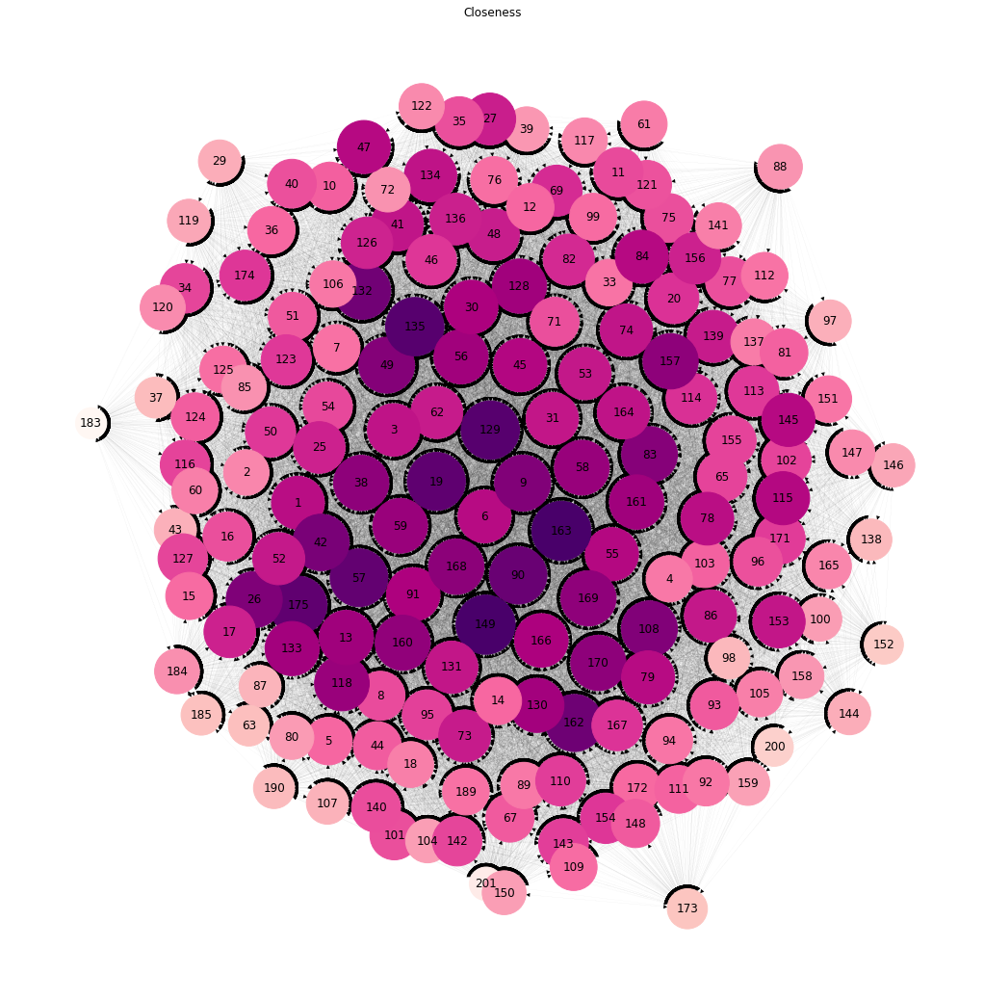

In [97]:
centrality = np.fromiter(closeness.values(), float)
# plot
pos = nx.kamada_kawai_layout(G_stations)
nx.draw(G_stations, pos,
        node_color=centrality,
        node_size=centrality*100,
        cmap = "RdPu",
        width = 0.01)
nx.draw_networkx_labels(G_stations, pos)
plt.title("Closeness")
plt.show()

Representamos sobre un mapa las estaciones con closeness pòr debajo del percentil 10 y por encima del percentil 90.

In [98]:
best_closeness = closeness_df[closeness_df["Closeness"] > closeness_df["Closeness"].quantile(.90)]
best_closeness["Label"] = "best"

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [99]:
worst_closeness = closeness_df[closeness_df["Closeness"] < closeness_df["Closeness"].quantile(.1)]
worst_closeness["Label"] = "worst"

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [100]:
closeness_df_ranking = pd.concat([best_closeness, worst_closeness])
closeness_df_ranking.sort_values(by = "Closeness")

,Id,Closeness,Barrio,Dirección,Lat,Lon,Label
165,183,10.411126,04-03 FUENTE DEL BERRO,"CALLE DE HERMOSILLA, 135",40.4256359410288,-3.66945062094213,worst
171,201,12.129967,07-06 VALLEHERMOSO,"CALLE DE JOSE ABASCAL, frente al 2",40.4387323940721,-3.70381604764219,worst
170,200,15.930682,07-05 RÍOS ROSAS,"GLORIETA DE QUEVEDO, 4",40.4336617785123,-3.70467099810926,worst
141,152,16.514263,06-02 CUATRO CAMINOS,"AVENIDA DEL GENERAL PERON, S/N",40.4527164088074,-3.69894968717916,worst
162,173,17.281900,02-02 ACACIAS,"PASEO DE LA ESPERANZA, 59",40.3981758743262,-3.70236151429629,worst
167,185,17.580989,04-05 LISTA,"GLORIETA DEL MARQUES DE ZAFRA, 4",40.4250683619825,-3.66153295744438,worst
56,63,17.899660,03-05 JERÓNIMOS,"CALLE DE IBIZA, 64",40.4178875219131,-3.67068030225406,worst
30,37,18.043444,01-01 PALACIO,"PLAZA DE SAN FRANCISCO, 5",40.4108607472815,-3.7141233769735,worst
169,190,18.144615,04-04 GUINDALERA,"CALLE DE VELAZQUEZ, 91",40.4343751094586,-3.6834686388527,worst
127,138,18.327881,05-01 EL VISO,"PASEO DE LA CASTELLANA, S/N",40.4456885729012,-3.69158175095202,worst


In [101]:
import folium

Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)

for x in range(closeness_df_ranking.shape[0]):
  
  lat = float(closeness_df_ranking.iloc[x,4])
  lon = float(closeness_df_ranking.iloc[x,5])
  loc = [lat, lon]

  neigh = closeness_df_ranking.iloc[x,2]
  
  datos = ("<b>Station number: </b>"+str(closeness_df_ranking.iloc[x,0])+""+"\n"+
           "<b>Betweenness: </b>"+str(closeness_df_ranking.iloc[x,1]))

  address = closeness_df_ranking.iloc[x,3]
  
  if  closeness_df_ranking.iloc[x,6] == "best":
    col = "green"
  else:
    col = "red"
  
  folium.Marker(location = loc,
                  popup = datos,
                  tooltip = address,
                  icon = folium.Icon(icon = "fa-bicycle",
                                     prefix = 'fa',
                                     color = "white",
                                     icon_color = col)).add_to(Mad)

Mad

### BETWEENNESS

El betweness de un nodo cuantifica el número de veces que etse se encuentra entre los caminos más cortos de otros nodos.


Dado un grafo $G=(V,E)$ donde $V$ es el conjunto de nodos y $E$ el conjunto de arcos, el betweenness $C_{B}(u)$ de un nodo $u$ se define como:
$$ C_{B}(u) = \sum_{j\neq k \in  V} \frac{b_{juk}}{b_{jk}}$$
donde $b_{juk}$ es el número de caminos más cortos desde el nodo $j$ hasta que nodo $k$ que pasan por $u$; $b_{jk}$ es el número de caminos más cortos desde $j$ hasta $k$. 

Es por ello que, nuevamente, tenemos que usar la columna "Weight-Inverse" y no "Weight" para valorar los arcos. Los nodos que más cerca están son los que más viajes tienen entre sí. Es por ello que el peso "Weight" resulta erróneo para calcular esta métrica. Lo especificamos en el argumento `weight = "Weight-Inverse"`. 

También indicamos que sea normalizado mediente el argumento `normalized = True`. En grafos dirigidos, netwrokx normaliza por $1/((N-1)(N-2))$ donde $N$ es el cardinal de $V$.


In [102]:
# Betweenness
betweenness = dict(nx.betweenness_centrality(G_stations,
                                             weight = "Weight-Inverse",
                                             normalized = True))

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e24104a50>]],
      dtype=object)

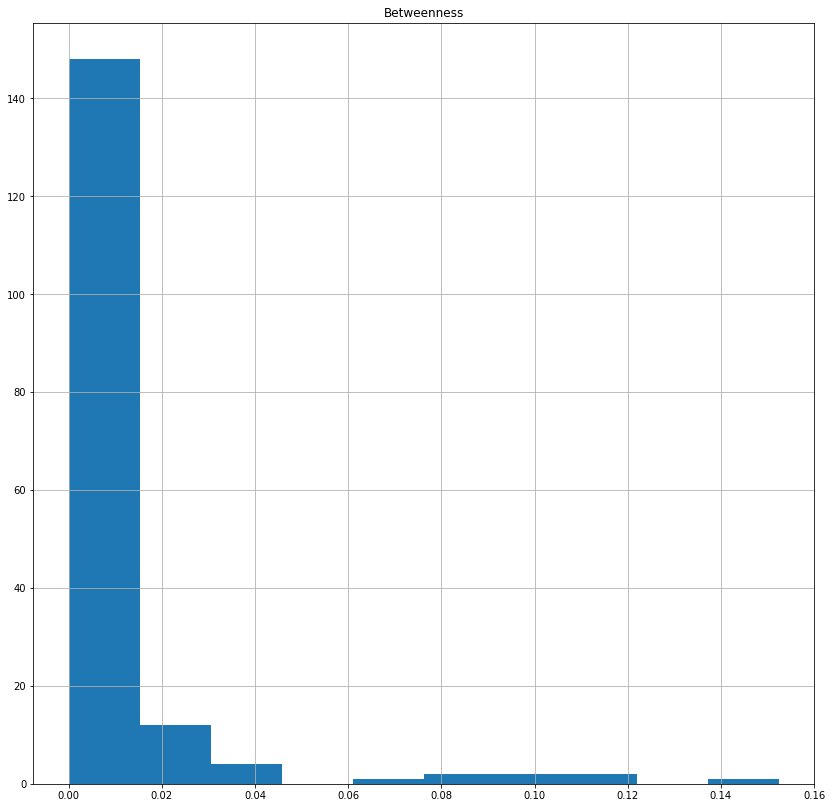

In [103]:
# Histogram for betweenness
betweenness_df = pd.DataFrame(betweenness, index = [0]).transpose().sort_index()
betweenness_df.columns = ["Betweenness"]
betweenness_df.hist()

In [104]:
betweenness_df = betweenness_df.reset_index().\
                      rename(columns = {"index" : "Id"})
betweenness_df = pd.merge(betweenness_df, df_stations, on ="Id", how = "left")
betweenness_df.sort_values(by = "Betweenness", ascending = False)

,Id,Betweenness,Barrio,Dirección,Lat,Lon
152,163,0.152460,02-05 DELICIAS,"PASEO DE LA ESPERANZA, 8,33333333333333E-02",40.4036350443485,-3.70643717926717
164,175,0.114964,02-05 DELICIAS,"CALLE DE JAIME EL CONQUISTADOR, 30",40.3962332942252,-3.69830799524925
118,129,0.110630,07-05 RÍOS ROSAS,"CALLE DE JOSE ABASCAL, 33",40.4384681956916,-3.69828378445489
124,135,0.101686,05-01 EL VISO,"PLAZA DE SAN JUAN DE LA CRUZ, S/N",40.4414846142904,-3.69289006443077
138,149,0.096904,05-01 EL VISO,"PASEO DE LA HABANA, 42",40.4498451697623,-3.68784808757322
...,...,...,...,...,...,...
82,93,0.000000,04-01 RECOLETOS,"CALLE DE GOYA, 3",40.4256985386158,-3.68941240253483
81,92,0.000000,04-01 RECOLETOS,"CALLE DE CLAUDIO COELLO, 45",40.4262238150408,-3.68648204673692
77,88,0.000000,04-02 GOYA,"CALLE DE VELAZQUEZ, 73",40.4312078719674,-3.68374710672573
76,87,0.000000,04-06 CASTELLANA,"CALLE DE AYALA, 44",40.427671835026,-3.68356310915291


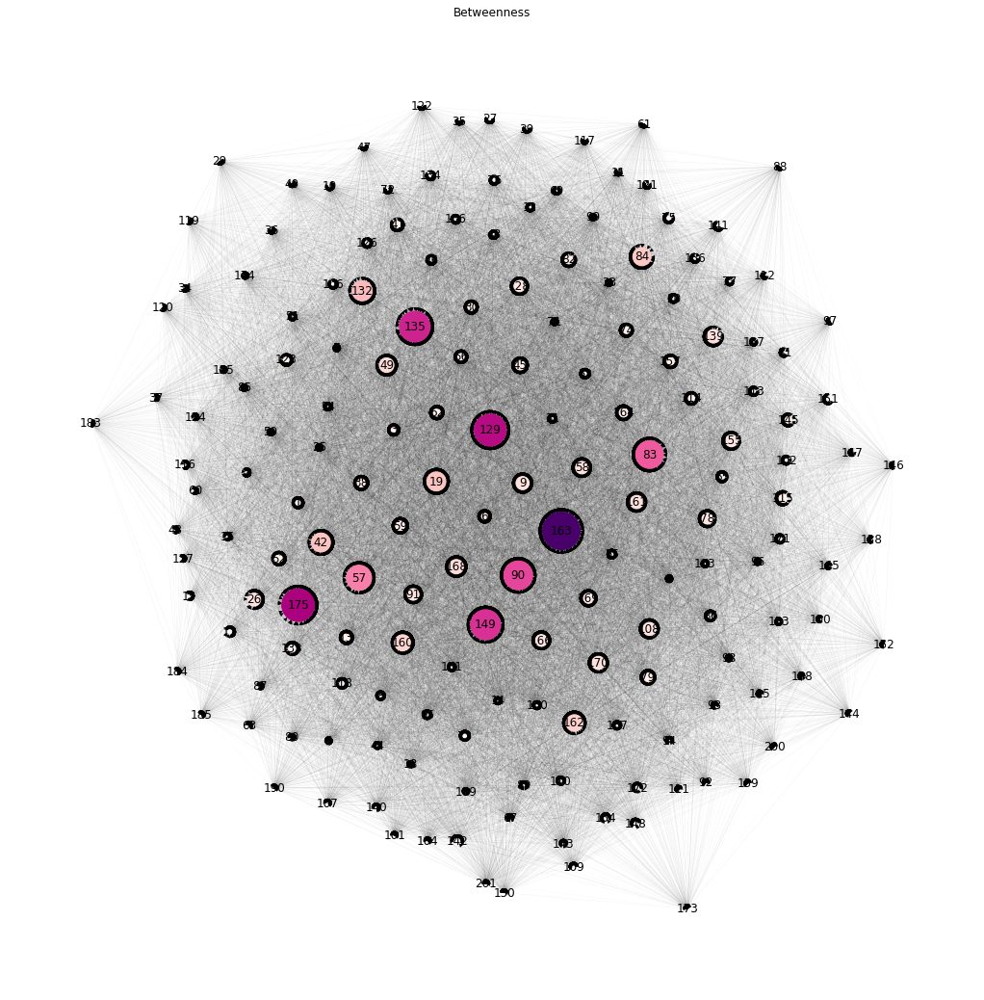

In [105]:
centrality = np.fromiter(betweenness.values(), float)
# plot
pos = nx.kamada_kawai_layout(G_stations)
nx.draw(G_stations, pos,
        node_color = centrality,
        node_size = centrality * 10000,
        cmap = "RdPu",
        width = 0.01)
nx.draw_networkx_labels(G_stations, pos)
plt.title("Betweenness")
plt.show()

Representamos sobre un mapa las 10 estaciones con más betweenness -verda- y las 10 con menos betweenness -rojo-

In [106]:
best_betweenness = betweenness_df[betweenness_df["Betweenness"] > betweenness_df["Betweenness"].quantile(.90)]
best_betweenness["Label"] = "best"
best_betweenness

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Id,Betweenness,Barrio,Dirección,Lat,Lon,Label
18,19,0.039009,01-04 JUSTICIA,"CALLE DE PRIM, 4",40.421902428886,-3.69539476751156,best
35,42,0.038786,01-02 EMBAJADORES,"CALLE DE SANTA ISABEL, 32",40.410744084974,-3.69820680839403,best
42,49,0.022927,01-02 EMBAJADORES,"RONDA DE ATOCHA, 36",40.406049872348,-3.69924264482009,best
50,57,0.067939,01-04 JUSTICIA,"CALLE DE SANTA CRUZ DE MARCENADO, 24",40.4296364220195,-3.71281811499328,best
72,83,0.082129,03-02 ADELFAS,"CALLE DE PIO BAROJA, 8 B",40.4132590448197,-3.67453386290371,best
73,84,0.035294,03-05 JERÓNIMOS,"CALLE DEL DOCTOR ESQUERDO, 191",40.4033696223995,-3.67269230594786,best
79,90,0.089044,04-01 RECOLETOS,"CALLE DE GOYA, 18",40.4250879599628,-3.6837296911372,best
118,129,0.110630,07-05 RÍOS ROSAS,"CALLE DE JOSE ABASCAL, 33",40.4384681956916,-3.69828378445489,best
121,132,0.043653,06-02 CUATRO CAMINOS,"CALLE DE SANTA ENGRACIA, 168",40.4463890735351,-3.70359108458389,best
124,135,0.101686,05-01 EL VISO,"PLAZA DE SAN JUAN DE LA CRUZ, S/N",40.4414846142904,-3.69289006443077,best


In [107]:
worst_betweenness = betweenness_df[betweenness_df["Betweenness"] <= betweenness_df["Betweenness"].quantile(.1)]
worst_betweenness["Label"] = "worst"
worst_betweenness

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,Id,Betweenness,Barrio,Dirección,Lat,Lon,Label
3,4,0.0,01-05 UNIVERSIDAD,"CALLE DE MANUELA MALASAÑA, 3",40.4285905943729,-3.70267393708668,worst
4,5,0.0,01-04 JUSTICIA,"CALLE DE FUENCARRAL, 106",40.4283629640739,-3.70207622424503,worst
6,7,0.0,01-04 JUSTICIA,"CALLE DE HORTALEZA, 75",40.4252162366264,-3.69773989991129,worst
10,11,0.0,01-05 UNIVERSIDAD,"CALLE DE SAN ANDRES, 20",40.4270517794408,-3.7036191769509,worst
17,18,0.0,01-04 JUSTICIA,"PLAZA DE PEDRO ZEROLO, 1",40.4209207635836,-3.69956787320867,worst
...,...,...,...,...,...,...,...
167,185,0.0,04-05 LISTA,"GLORIETA DEL MARQUES DE ZAFRA, 4",40.4250683619825,-3.66153295744438,worst
168,189,0.0,04-06 CASTELLANA,"CALLE DE LA VIRGEN DE LA ALEGRIA, 18",40.4351226521444,-3.65551827726975,worst
169,190,0.0,04-04 GUINDALERA,"CALLE DE VELAZQUEZ, 91",40.4343751094586,-3.6834686388527,worst
170,200,0.0,07-05 RÍOS ROSAS,"GLORIETA DE QUEVEDO, 4",40.4336617785123,-3.70467099810926,worst


In [108]:
betweenness_df_ranking = pd.concat([best_betweenness, worst_betweenness])
betweenness_df_ranking

,Id,Betweenness,Barrio,Dirección,Lat,Lon,Label
18,19,0.039009,01-04 JUSTICIA,"CALLE DE PRIM, 4",40.421902428886,-3.69539476751156,best
35,42,0.038786,01-02 EMBAJADORES,"CALLE DE SANTA ISABEL, 32",40.410744084974,-3.69820680839403,best
42,49,0.022927,01-02 EMBAJADORES,"RONDA DE ATOCHA, 36",40.406049872348,-3.69924264482009,best
50,57,0.067939,01-04 JUSTICIA,"CALLE DE SANTA CRUZ DE MARCENADO, 24",40.4296364220195,-3.71281811499328,best
72,83,0.082129,03-02 ADELFAS,"CALLE DE PIO BAROJA, 8 B",40.4132590448197,-3.67453386290371,best
...,...,...,...,...,...,...,...
167,185,0.000000,04-05 LISTA,"GLORIETA DEL MARQUES DE ZAFRA, 4",40.4250683619825,-3.66153295744438,worst
168,189,0.000000,04-06 CASTELLANA,"CALLE DE LA VIRGEN DE LA ALEGRIA, 18",40.4351226521444,-3.65551827726975,worst
169,190,0.000000,04-04 GUINDALERA,"CALLE DE VELAZQUEZ, 91",40.4343751094586,-3.6834686388527,worst
170,200,0.000000,07-05 RÍOS ROSAS,"GLORIETA DE QUEVEDO, 4",40.4336617785123,-3.70467099810926,worst


In [109]:
import folium

Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)

for x in range(betweenness_df_ranking.shape[0]):
  
  lat = float(betweenness_df_ranking.iloc[x,4])
  lon = float(betweenness_df_ranking.iloc[x,5])
  loc = [lat, lon]

  neigh = betweenness_df_ranking.iloc[x,2]
  
  datos = ("<b>Station number: </b>"+str(betweenness_df_ranking.iloc[x,0])+""+"\n"+
           "<b>Betweenness: </b>"+str(betweenness_df_ranking.iloc[x,1]))

  address = betweenness_df_ranking.iloc[x,3]
  
  if  betweenness_df_ranking.iloc[x,6] == "best":
    col = "green"
  else:
    col = "red"
  
  folium.Marker(location = loc,
                  popup = datos,
                  tooltip = address,
                  icon = folium.Icon(icon = "fa-bicycle",
                                     prefix = 'fa',
                                     color = "white",
                                     icon_color = col)).add_to(Mad)

Mad

### EIGENVECTOR CENTRALITY

Sea un grafo dirigido y valorado $G=(V,E)$. El eigenvector centrlity calcula la centralidad de un nodo en base a la centralidad de sus nodos vecinos. El eigenvector centrality de un nodo $u$ se define como:
$$Ax = \lambda x$$
donde $A$ es la matriz de adyacencia del grafo y $\lambda$ es autovalor. Por el teorema de Perron-Frobeniuos, existe una sólución única y positiva si $\lambda$ es el mayor autovalor asociado al autovector del la matriz de adyacencia $A$.


Es fundamental entender que es la *matriz de adyacencia de  $G$*. Se trata de una representación matricial en el que la entrada $a_{ij}$ de la matriz de adyacencia $A$ se corresponde con el peso del arco que une el nodo $i$ con el nodo $j$. 



In [110]:
# Eigenvector centrality
eigen_centrality = nx.eigenvector_centrality(G_stations, weight = "Weight")

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e1944ac90>]],
      dtype=object)

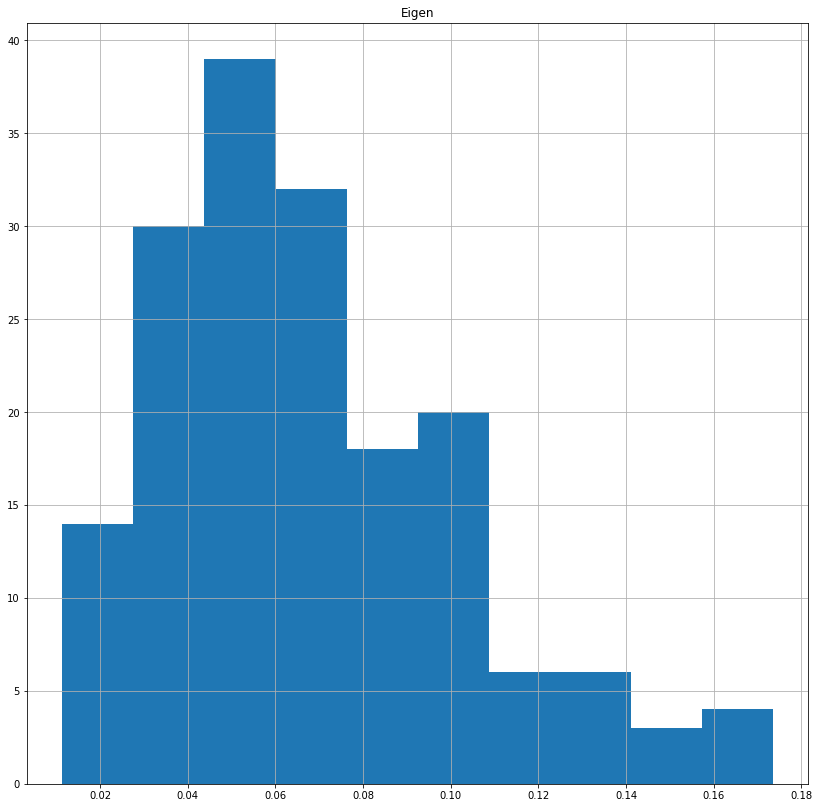

In [111]:
# Histogram
eigen_df = pd.DataFrame(eigen_centrality, index = [0]).transpose().sort_index()
eigen_df.columns = ["Eigen"]
eigen_df.hist()

In [112]:
eigen_df = eigen_df.reset_index().\
                      rename(columns = {"index" : "Id"})
eigen_df = pd.merge(eigen_df, df_stations, on ="Id", how = "left")
eigen_df.sort_values(by = "Eigen", ascending = False)

,Id,Eigen,Barrio,Dirección,Lat,Lon
124,135,0.173468,05-01 EL VISO,"PLAZA DE SAN JUAN DE LA CRUZ, S/N",40.4414846142904,-3.69289006443077
152,163,0.168467,02-05 DELICIAS,"PASEO DE LA ESPERANZA, 8,33333333333333E-02",40.4036350443485,-3.70643717926717
118,129,0.168185,07-05 RÍOS ROSAS,"CALLE DE JOSE ABASCAL, 33",40.4384681956916,-3.69828378445489
164,175,0.159305,02-05 DELICIAS,"CALLE DE JAIME EL CONQUISTADOR, 30",40.3962332942252,-3.69830799524925
138,149,0.154175,05-01 EL VISO,"PASEO DE LA HABANA, 42",40.4498451697623,-3.68784808757322
...,...,...,...,...,...,...
171,201,0.021390,07-06 VALLEHERMOSO,"CALLE DE JOSE ABASCAL, frente al 2",40.4387323940721,-3.70381604764219
23,29,0.020444,01-01 PALACIO,"CALLE DEL MARQUES DE CUBAS, 25",40.416244109804,-3.69580079339477
141,152,0.020307,06-02 CUATRO CAMINOS,"AVENIDA DEL GENERAL PERON, S/N",40.4527164088074,-3.69894968717916
162,173,0.018911,02-02 ACACIAS,"PASEO DE LA ESPERANZA, 59",40.3981758743262,-3.70236151429629


In [113]:
eigen_df.sort_values(by = "Eigen", ascending = False).head(10)

,Id,Eigen,Barrio,Dirección,Lat,Lon
124,135,0.173468,05-01 EL VISO,"PLAZA DE SAN JUAN DE LA CRUZ, S/N",40.4414846142904,-3.69289006443077
152,163,0.168467,02-05 DELICIAS,"PASEO DE LA ESPERANZA, 8,33333333333333E-02",40.4036350443485,-3.70643717926717
118,129,0.168185,07-05 RÍOS ROSAS,"CALLE DE JOSE ABASCAL, 33",40.4384681956916,-3.69828378445489
164,175,0.159305,02-05 DELICIAS,"CALLE DE JAIME EL CONQUISTADOR, 30",40.3962332942252,-3.69830799524925
138,149,0.154175,05-01 EL VISO,"PASEO DE LA HABANA, 42",40.4498451697623,-3.68784808757322
50,57,0.151347,01-04 JUSTICIA,"CALLE DE SANTA CRUZ DE MARCENADO, 24",40.4296364220195,-3.71281811499328
79,90,0.146365,04-01 RECOLETOS,"CALLE DE GOYA, 18",40.4250879599628,-3.6837296911372
35,42,0.138634,01-02 EMBAJADORES,"CALLE DE SANTA ISABEL, 32",40.410744084974,-3.69820680839403
42,49,0.133385,01-02 EMBAJADORES,"RONDA DE ATOCHA, 36",40.406049872348,-3.69924264482009
121,132,0.132590,06-02 CUATRO CAMINOS,"CALLE DE SANTA ENGRACIA, 168",40.4463890735351,-3.70359108458389


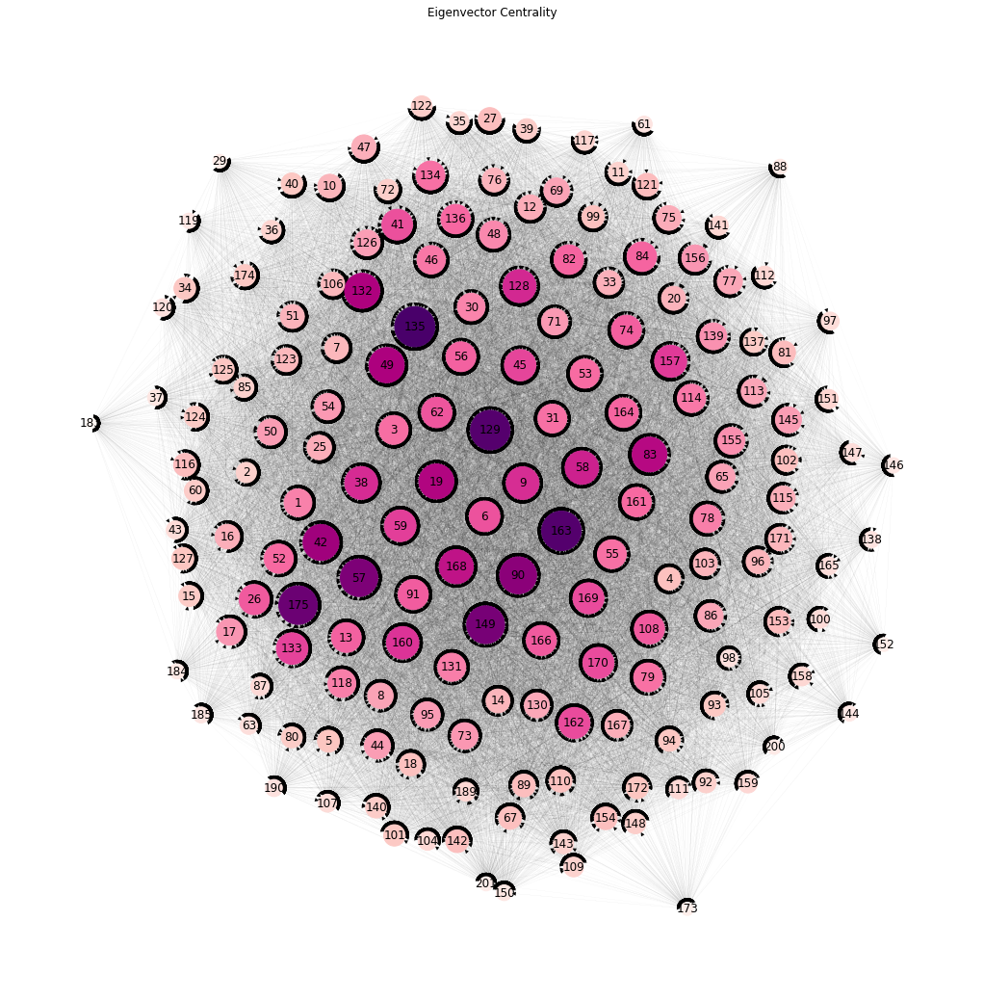

In [114]:
centrality = np.fromiter(eigen_centrality.values(), float)
# plot
pos = nx.kamada_kawai_layout(G_stations)
nx.draw(G_stations, pos,
        node_color=centrality,
        node_size=centrality*10000,
        cmap = "RdPu",
        width = 0.01)
nx.draw_networkx_labels(G_stations, pos)
plt.title("Eigenvector Centrality")
plt.show()

### PAGERANK

PageRank genera un ranking de nodos basado en las estructura de los arcos que llegan a cada nodo. Fue originalmente diseñado para hacer un ranking de páginas web. 

Intuitivamente, aquellas páginas a las que llegan muchos links son más importantes que aquellas a las que llegan pocos. Del mismo modo, cad alink tiene cierto prestigio, no es lo mismo que te cite un anónimo en su Blog que la revista Sciencie. PageRank pretende dar un ranking de los nodos según la estructura de links.

Por ello, esta vez sí debemos utilizar la columna "Weight"

In [115]:
# PageRank
pagerank = nx.pagerank(G_stations, 
                       weight = "Weight",
                       tol = 0.001)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e0f60c090>]],
      dtype=object)

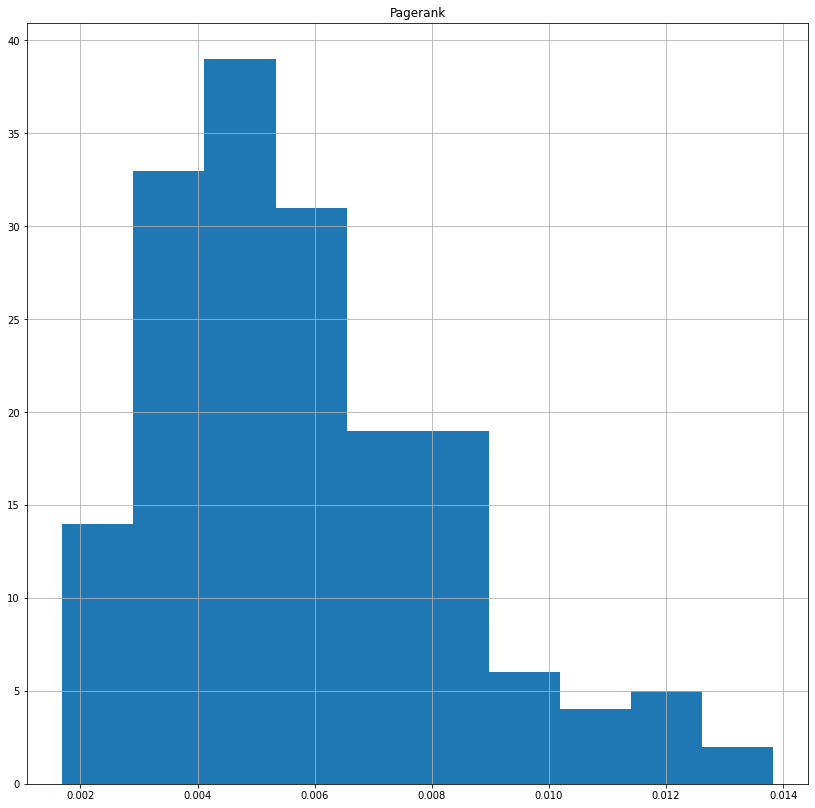

In [116]:
# Histogram for page rank
pagerank_df = pd.DataFrame(pagerank, index = [0]).transpose().sort_index()
pagerank_df.columns = ["Pagerank"]
pagerank_df.hist()

In [117]:
pagerank_df = pagerank_df.reset_index().\
                      rename(columns = {"index" : "Id"})
pagerank_df = pd.merge(pagerank_df, df_stations, on ="Id", how = "left")
pagerank_df.sort_values(by = "Pagerank", ascending = False)

,Id,Pagerank,Barrio,Dirección,Lat,Lon
152,163,0.013822,02-05 DELICIAS,"PASEO DE LA ESPERANZA, 8,33333333333333E-02",40.4036350443485,-3.70643717926717
118,129,0.012748,07-05 RÍOS ROSAS,"CALLE DE JOSE ABASCAL, 33",40.4384681956916,-3.69828378445489
124,135,0.012392,05-01 EL VISO,"PLAZA DE SAN JUAN DE LA CRUZ, S/N",40.4414846142904,-3.69289006443077
164,175,0.012160,02-05 DELICIAS,"CALLE DE JAIME EL CONQUISTADOR, 30",40.3962332942252,-3.69830799524925
79,90,0.011806,04-01 RECOLETOS,"CALLE DE GOYA, 18",40.4250879599628,-3.6837296911372
...,...,...,...,...,...,...
170,200,0.002536,07-05 RÍOS ROSAS,"GLORIETA DE QUEVEDO, 4",40.4336617785123,-3.70467099810926
162,173,0.002500,02-02 ACACIAS,"PASEO DE LA ESPERANZA, 59",40.3981758743262,-3.70236151429629
141,152,0.002388,06-02 CUATRO CAMINOS,"AVENIDA DEL GENERAL PERON, S/N",40.4527164088074,-3.69894968717916
23,29,0.002201,01-01 PALACIO,"CALLE DEL MARQUES DE CUBAS, 25",40.416244109804,-3.69580079339477


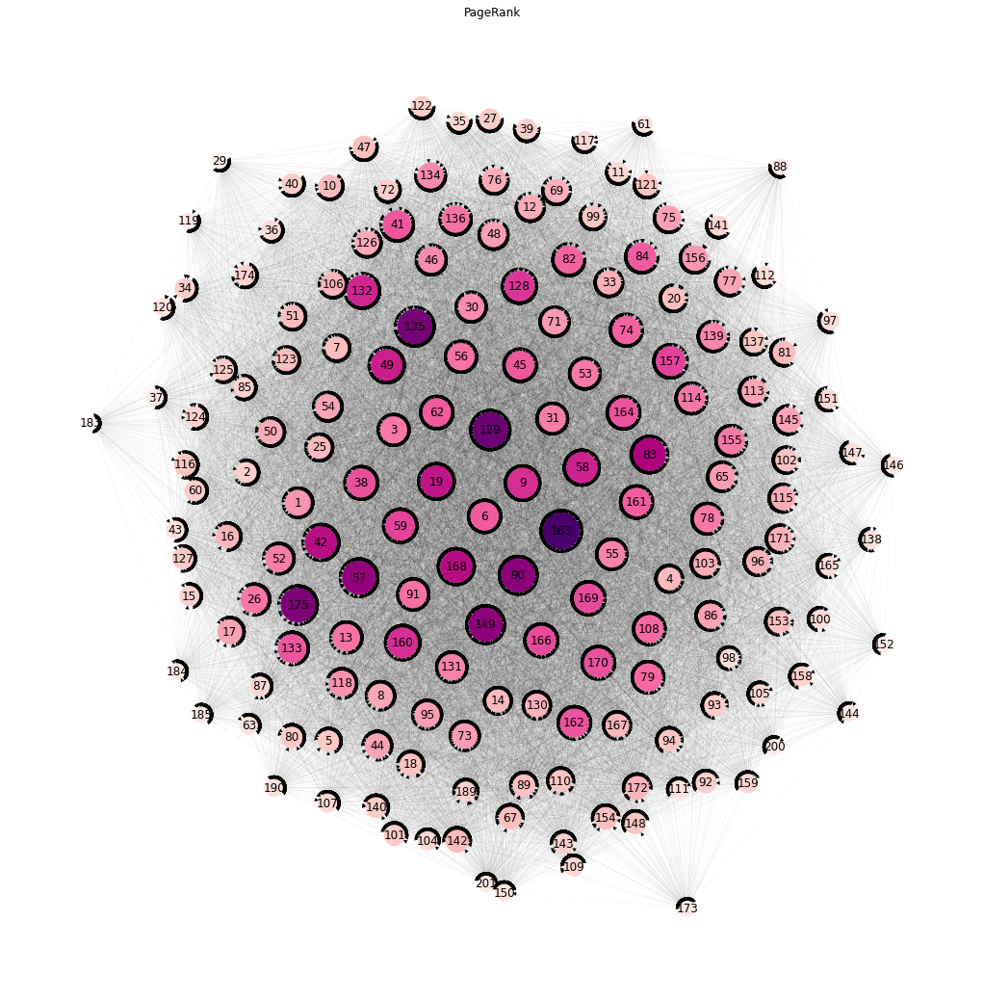

In [118]:
centrality = np.fromiter(pagerank.values(), float)
# plot
pos = nx.kamada_kawai_layout(G_stations)
nx.draw(G_stations, pos,
        node_color=centrality,
        node_size=centrality*100000,
        cmap = "RdPu",
        width = 0.01)
nx.draw_networkx_labels(G_stations, pos)
plt.title("PageRank")
plt.show()

### HITS

El algoritmo HITS calcula el authority de un nodo -basado en los arcos que llegan a él- y el hub -basado en los nodos que salen de él-.

La idea detrás de Hubs y Authorities surgió de una visión particular de la creación de páginas web. Ciertas páginas web conocidad como hubs sireven como grandes directorios que no son realmente autoritativos en la información que poseen sino que se usan como compilaciones de un amplio catálogo de información que redirige al usuario a otras páginas de más autoridad. Un hub representa una página que señala a otras muchas y un authority representa una web muy referenciada.


Es por ello que debemos usar "Weights"

In [119]:
#Authority and hubs
(hubs, authorities) = nx.hits(G_stations)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e0f644cd0>]],
      dtype=object)

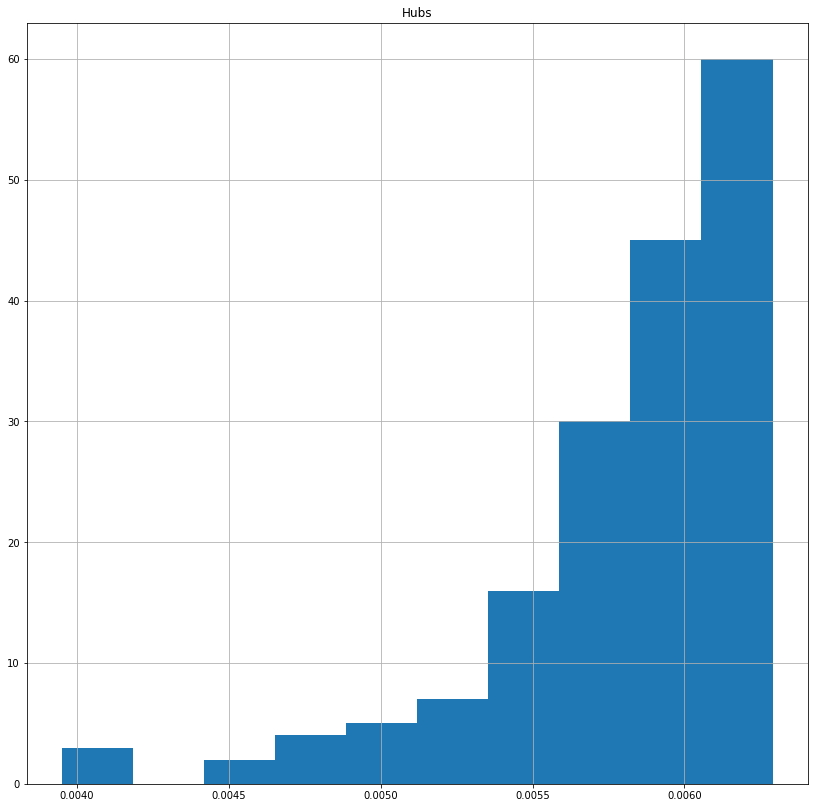

In [120]:
hubs_df = pd.DataFrame(hubs, index = [0]).transpose().sort_index()
hubs_df.columns = ["Hubs"]
hubs_df.hist()

In [121]:
hubs_df = hubs_df.reset_index().rename(columns = {"index" : "Id"})
hubs_df = pd.merge(hubs_df, df_stations, on ="Id", how = "left")
hubs_df.sort_values(by = "Hubs", ascending = False)

,Id,Hubs,Barrio,Dirección,Lat,Lon
157,168,0.006290,02-02 ACACIAS,"PASEO DE SANTA MARIA DE LA CABEZA, 32",40.4045829072803,-3.69591592521647
152,163,0.006289,02-05 DELICIAS,"PASEO DE LA ESPERANZA, 8,33333333333333E-02",40.4036350443485,-3.70643717926717
5,6,0.006289,01-04 JUSTICIA,"CALLE DE HORTALEZA, 63",40.4241634531642,-3.69840932124385
8,9,0.006289,01-01 PALACIO,"PLAZA DE SAN MIGUEL, 9",40.4156134806993,-3.70940929938434
150,161,0.006262,09-01 CASA DE CAMPO,"PASEO DE LA FLORIDA, 8",40.4221255199314,-3.72203499059955
...,...,...,...,...,...,...
166,184,0.004630,04-03 FUENTE DEL BERRO,"PASEO DEL MARQUES DE ZAFRA, 24",40.4260024599175,-3.66530950600264
108,119,0.004596,02-06 PALOS DE MOGUER,"CALLE DE MENDEZ ALVARO, 7",40.4014568219022,-3.68657767589888
77,88,0.004099,04-02 GOYA,"CALLE DE VELAZQUEZ, 73",40.4312078719674,-3.68374710672573
162,173,0.004083,02-02 ACACIAS,"PASEO DE LA ESPERANZA, 59",40.3981758743262,-3.70236151429629


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e20a3b310>]],
      dtype=object)

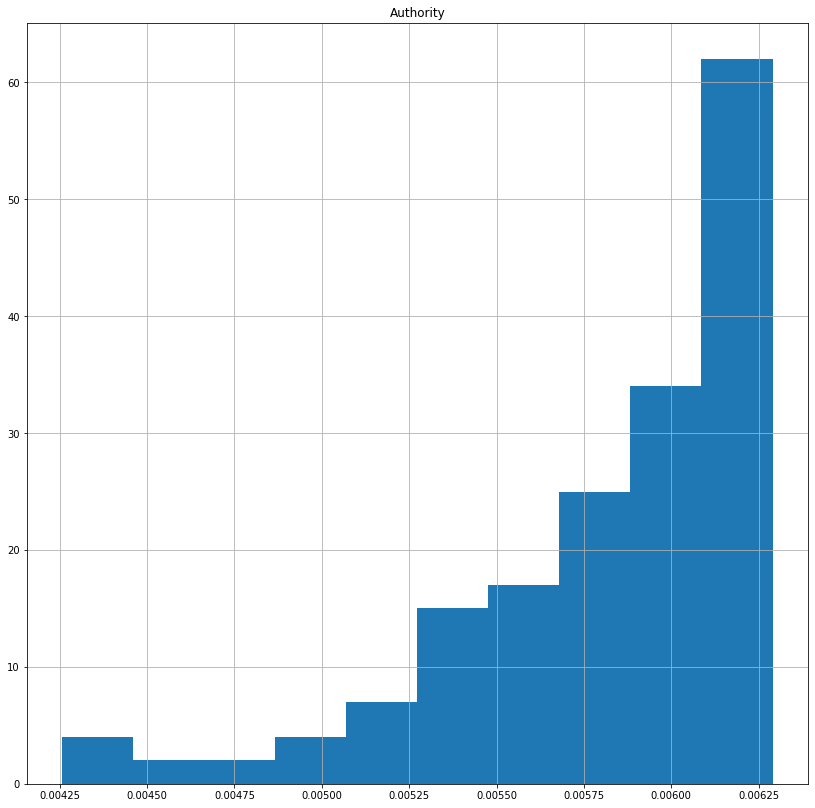

In [122]:
authority_df = pd.DataFrame(authorities, index = [0]).transpose().sort_index()
authority_df.columns = ["Authority"]
authority_df.hist()

In [123]:
authority_df = authority_df.reset_index().rename(columns = {"index" : "Id"})
authority_df = pd.merge(authority_df, df_stations, on ="Id", how = "left")
authority_df.sort_values(by = "Authority", ascending = False)

,Id,Authority,Barrio,Dirección,Lat,Lon
48,55,0.006290,01-06 SOL,"PLAZA DE SAN ILDEFONSO, 8",40.4240716834595,-3.70192951808313
50,57,0.006289,01-04 JUSTICIA,"CALLE DE SANTA CRUZ DE MARCENADO, 24",40.4296364220195,-3.71281811499328
118,129,0.006289,07-05 RÍOS ROSAS,"CALLE DE JOSE ABASCAL, 33",40.4384681956916,-3.69828378445489
51,58,0.006289,01-05 UNIVERSIDAD,"CALLE DE AUGUSTO FIGUEROA, 33",40.422258617772,-3.69794108992409
79,90,0.006289,04-01 RECOLETOS,"CALLE DE GOYA, 18",40.4250879599628,-3.6837296911372
...,...,...,...,...,...,...
77,88,0.004567,04-02 GOYA,"CALLE DE VELAZQUEZ, 73",40.4312078719674,-3.68374710672573
108,119,0.004429,02-06 PALOS DE MOGUER,"CALLE DE MENDEZ ALVARO, 7",40.4014568219022,-3.68657767589888
23,29,0.004416,01-01 PALACIO,"CALLE DEL MARQUES DE CUBAS, 25",40.416244109804,-3.69580079339477
162,173,0.004262,02-02 ACACIAS,"PASEO DE LA ESPERANZA, 59",40.3981758743262,-3.70236151429629


Representamos en un mapa los más hubs -rojo- y los más authority -verde-:

In [124]:
my_auth_df = authority_df.sort_values(by = "Authority", ascending = False).head(10)
my_auth_df["Label"] = "auth"
my_hubs_df = hubs_df.sort_values(by = "Hubs", ascending = False).head(10)
my_hubs_df["Label"] = "hubs"
my_auth_hub_df = pd.concat([my_auth_df, my_hubs_df])

In [125]:

Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)

for x in range(my_auth_hub_df.shape[0]):
  
  lat = float(my_auth_hub_df.iloc[x,4])
  lon = float(my_auth_hub_df.iloc[x,5])
  loc = [lat, lon]

  neigh = my_auth_hub_df.iloc[x,2]
  
  datos = ("<b>Station number: </b>"+str(my_auth_hub_df.iloc[x,0])+""+"\n"+
           "<b>Betweenness: </b>"+str(my_auth_hub_df.iloc[x,1]))

  address = betweenness_df_ranking.iloc[x,3]
  
  if  my_auth_hub_df.iloc[x,6] == "auth":
    col = "green"
  else:
    col = "red"
  
  folium.Marker(location = loc,
                  popup = datos,
                  tooltip = address,
                  icon = folium.Icon(icon = "fa-bicycle",
                                     prefix = 'fa',
                                     color = "white",
                                     icon_color = col)).add_to(Mad)

Mad

### CLUSTERING

Para grafos valorados, existen diversas formas de definir el coeficiente de clustering. La librería `networkx` define el coeficiente de clustering de un nodo $u$ como:
$$c_{u} = \frac{1}{deg(u)(deg(u)-1)}\sum_{v,w\in V}(\hat{w}_{uv}\hat{w}_{uw}\hat{w}_{vw})^{1/3}$$
donde $V$ es el conjunto de vértidces del grado, $deg(u)$ es el grado del nodo $u$, $\hat{w}_{ij} = {w}_{ij} / max(w)$ donde ${w}_{ij}$ es el valor del arco que parte del nodo $i$ hasta el nodo $j$ y $max(w)$ el máximo de los pesos. 

nuevamente, debemos usar "Weigh".

In [126]:
# Average coefficiet clusterins
clustering = dict(nx.clustering(G_stations, weight = "Weight"))

In [127]:
print("Average cluster coefficient %s" % np.mean(list(clustering.values())))

Average cluster coefficient 0.034807888186262376


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f9e2014a490>]],
      dtype=object)

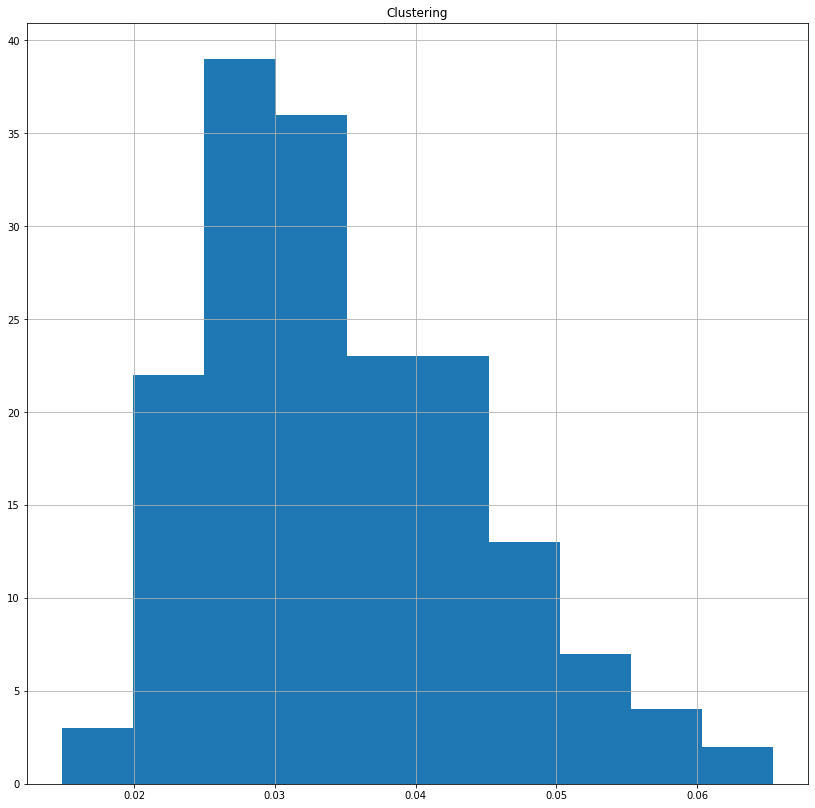

In [128]:
cluster_df = pd.DataFrame(clustering, index = [0]).transpose().sort_index()
cluster_df.columns = ["Clustering"]
cluster_df.hist()

In [129]:
cluster_df = cluster_df.reset_index().\
                      rename(columns = {"index" : "Id"})
cluster_df = pd.merge(cluster_df, df_stations, on ="Id", how = "left")
cluster_df.sort_values(by = "Clustering", ascending = False)

,Id,Clustering,Barrio,Dirección,Lat,Lon
152,163,0.065371,02-05 DELICIAS,"PASEO DE LA ESPERANZA, 8,33333333333333E-02",40.4036350443485,-3.70643717926717
118,129,0.061307,07-05 RÍOS ROSAS,"CALLE DE JOSE ABASCAL, 33",40.4384681956916,-3.69828378445489
164,175,0.059375,02-05 DELICIAS,"CALLE DE JAIME EL CONQUISTADOR, 30",40.3962332942252,-3.69830799524925
79,90,0.059177,04-01 RECOLETOS,"CALLE DE GOYA, 18",40.4250879599628,-3.6837296911372
50,57,0.058207,01-04 JUSTICIA,"CALLE DE SANTA CRUZ DE MARCENADO, 24",40.4296364220195,-3.71281811499328
...,...,...,...,...,...,...
141,152,0.020412,06-02 CUATRO CAMINOS,"AVENIDA DEL GENERAL PERON, S/N",40.4527164088074,-3.69894968717916
170,200,0.020162,07-05 RÍOS ROSAS,"GLORIETA DE QUEVEDO, 4",40.4336617785123,-3.70467099810926
171,201,0.019762,07-06 VALLEHERMOSO,"CALLE DE JOSE ABASCAL, frente al 2",40.4387323940721,-3.70381604764219
23,29,0.019555,01-01 PALACIO,"CALLE DEL MARQUES DE CUBAS, 25",40.416244109804,-3.69580079339477


Dejamos que haga un plot de manera automática. Los colores los pone uen función del coeficiente medio de clustering. Dado que la red es muy conexa, quizá el clustering no sea una de las mejores medidas para extraer conclusiones.

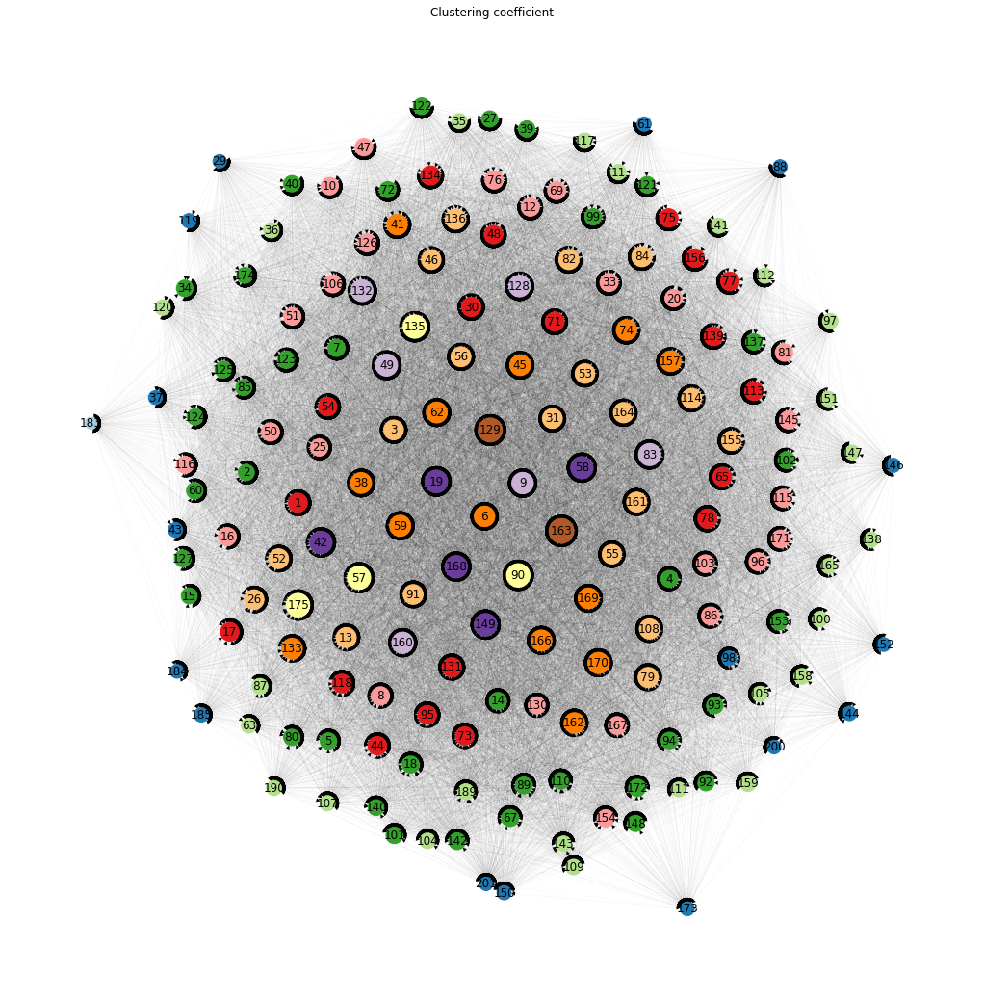

In [130]:
centrality = np.fromiter(clustering.values(), float)
# plot
pos = nx.kamada_kawai_layout(G_stations)
nx.draw(G_stations, pos,
        node_color=centrality,
        node_size=centrality*10000,
        cmap = "Paired",
        width = 0.01)
nx.draw_networkx_labels(G_stations, pos)
plt.title("Clustering coefficient")
plt.show()

### UNIÓN DE MÉTRICAS EN UN ÚNICO DATAFRAME

In [131]:
degrees_df.shape

(172, 7)

In [132]:
from functools import reduce
ls = [degrees_df, closeness_df, betweenness_df, pagerank_df, cluster_df, eigen_df,
      hubs_df, authority_df]
df_results = reduce(lambda df1,df2: pd.merge(df1,df2,on='Id',  suffixes=('', '_DROP')),  ls).filter(regex='^(?!.*_DROP)')
df_results

,Id,Degree,Degree-Weighted,In-Degree,In-Degree-Weighted,Out-Degree,Out-Degree-Weighted,Closeness,Barrio,Dirección,Lat,Lon,Betweenness,Pagerank,Clustering,Eigen,Hubs,Authority
0,1,335,5514,169,2746,166,2768,30.197861,01-06 SOL,"CALLE DE ALCALA, 2",40.4171107953153,-3.70199802576925,0.002477,0.006531,0.038596,0.083006,0.006130,0.006234
1,2,319,3229,159,1593,160,1636,22.273479,01-05 UNIVERSIDAD,"CALLE DE MIGUEL MOYA, 1",40.4205801410996,-3.7056738708445,0.000275,0.004182,0.027818,0.044022,0.005922,0.005894
2,3,338,6212,169,3118,169,3094,29.696248,07-02 ARAPILES,"PLAZA DEL CONDE DEL VALLE DE SUCHIL, 2",40.4303225635761,-3.70721222717123,0.002718,0.007298,0.041913,0.090018,0.006226,0.006228
3,4,329,4027,165,2030,164,1997,23.057419,01-05 UNIVERSIDAD,"CALLE DE MANUELA MALASAÑA, 3",40.4285905943729,-3.70267393708668,0.000000,0.005105,0.030703,0.054413,0.006056,0.006095
4,5,317,3467,155,1770,162,1697,24.290284,01-04 JUSTICIA,"CALLE DE FUENCARRAL, 106",40.4283629640739,-3.70207622424503,0.000000,0.004515,0.029756,0.051862,0.005997,0.005753
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167,185,261,1799,133,898,128,901,17.580989,04-05 LISTA,"GLORIETA DEL MARQUES DE ZAFRA, 4",40.4250683619825,-3.66153295744438,0.000000,0.002705,0.022277,0.027608,0.004778,0.004959
168,189,317,3014,162,1505,155,1509,23.473495,04-06 CASTELLANA,"CALLE DE LA VIRGEN DE LA ALEGRIA, 18",40.4351226521444,-3.65551827726975,0.000000,0.004022,0.026669,0.038723,0.005745,0.005982
169,190,283,2300,139,1127,144,1173,18.144615,04-04 GUINDALERA,"CALLE DE VELAZQUEZ, 91",40.4343751094586,-3.6834686388527,0.000000,0.003204,0.024267,0.031406,0.005371,0.005197
170,200,278,1637,140,802,138,835,15.930682,07-05 RÍOS ROSAS,"GLORIETA DE QUEVEDO, 4",40.4336617785123,-3.70467099810926,0.000000,0.002536,0.020162,0.022891,0.005160,0.005229


Reordenamos las columnas:

In [133]:
my_set  = set(df_results.columns) - set(["Id", "Dirección", "Barrio", "Lat", "Lon"])

In [134]:
df_results = df_results[[*["Id", "Dirección", "Barrio", "Lat", "Lon"], *sorted(list(my_set))]]
df_results.head()

,Id,Dirección,Barrio,Lat,Lon,Authority,Betweenness,Closeness,Clustering,Degree,Degree-Weighted,Eigen,Hubs,In-Degree,In-Degree-Weighted,Out-Degree,Out-Degree-Weighted,Pagerank
0,1,"CALLE DE ALCALA, 2",01-06 SOL,40.4171107953153,-3.70199802576925,0.006234,0.002477,30.197861,0.038596,335,5514,0.083006,0.006130,169,2746,166,2768,0.006531
1,2,"CALLE DE MIGUEL MOYA, 1",01-05 UNIVERSIDAD,40.4205801410996,-3.7056738708445,0.005894,0.000275,22.273479,0.027818,319,3229,0.044022,0.005922,159,1593,160,1636,0.004182
2,3,"PLAZA DEL CONDE DEL VALLE DE SUCHIL, 2",07-02 ARAPILES,40.4303225635761,-3.70721222717123,0.006228,0.002718,29.696248,0.041913,338,6212,0.090018,0.006226,169,3118,169,3094,0.007298
3,4,"CALLE DE MANUELA MALASAÑA, 3",01-05 UNIVERSIDAD,40.4285905943729,-3.70267393708668,0.006095,0.000000,23.057419,0.030703,329,4027,0.054413,0.006056,165,2030,164,1997,0.005105
4,5,"CALLE DE FUENCARRAL, 106",01-04 JUSTICIA,40.4283629640739,-3.70207622424503,0.005753,0.000000,24.290284,0.029756,317,3467,0.051862,0.005997,155,1770,162,1697,0.004515


In [135]:
from google.colab import files
df_results.to_csv('my_results.csv') 
files.download('my_results.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### Otras medidas: HEATMAP


Podemos hacer un mapa de color que enfrente estaciones origen y estaciones destino. Las casillas estraán coloreadas en función del número de viajes. Cuanto más oscuro, mayor será el número de viajes.

In [136]:
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

import seaborn as sns
import plotly.graph_objects as go

In [137]:
aux = df[["Source_Direccion", "Target_Direccion", "Weight"]]
aux = aux.pivot_table(index = "Source_Direccion", columns= "Target_Direccion", values= "Weight", aggfunc = np.sum)

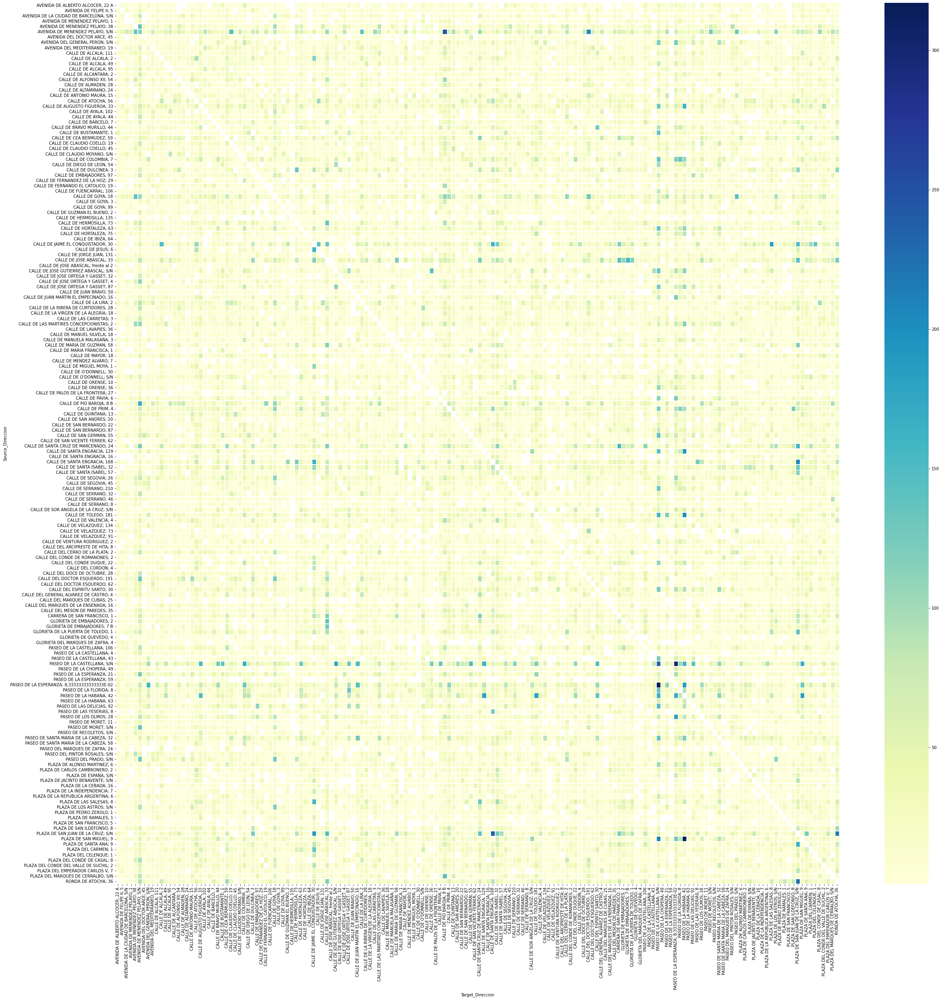

In [138]:
import matplotlib.pyplot as plt
fig, ax = plt.subplots(figsize=(40,40))        
sns.heatmap(aux,  linewidths=.5, cmap="YlGnBu")

### Otras medidas: K-MEANS

Aplicamos k-means al grafo dirigido.

In [139]:
from sklearn.cluster import AffinityPropagation
from sklearn.cluster import KMeans

A = nx.to_scipy_sparse_matrix(G_stations)
ap = KMeans(n_clusters = 8).fit(A.toarray())
print(ap.labels_)

[2 2 2 2 2 2 2 2 2 2 2 2 1 1 2 2 2 2 2 2 2 2 2 2 2 2 2 1 2 2 2 2 2 2 3 2 2
 2 2 2 3 2 2 2 2 3 2 2 2 2 3 2 2 2 2 2 2 3 1 2 2 2 2 2 2 2 2 2 2 2 2 1 2 3
 2 2 2 2 3 1 2 1 2 2 1 1 3 3 2 2 2 2 2 2 2 2 2 3 1 2 3 2 2 2 2 1 2 2 1 2 1
 2 7 1 2 1 2 1 2 2 2 3 1 2 2 3 2 1 3 2 5 2 2 2 7 2 3 2 1 1 1 1 2 1 2 1 1 3
 2 2 2 2 1 2 1 5 2 1 1 2 2 1 2 4 0 1 1 0 1 6 1 1]


In [140]:
df_stations_aux = df_stations.copy()
df_stations_aux["cluster"] = ap.labels_
df_stations_aux

,Id,Barrio,Dirección,Lat,Lon,cluster
0,1,01-06 SOL,"CALLE DE ALCALA, 2",40.4171107953153,-3.70199802576925,2
1,2,01-05 UNIVERSIDAD,"CALLE DE MIGUEL MOYA, 1",40.4205801410996,-3.7056738708445,2
2,3,07-02 ARAPILES,"PLAZA DEL CONDE DEL VALLE DE SUCHIL, 2",40.4303225635761,-3.70721222717123,2
3,4,01-05 UNIVERSIDAD,"CALLE DE MANUELA MALASAÑA, 3",40.4285905943729,-3.70267393708668,2
4,5,01-04 JUSTICIA,"CALLE DE FUENCARRAL, 106",40.4283629640739,-3.70207622424503,2
...,...,...,...,...,...,...
167,185,04-05 LISTA,"GLORIETA DEL MARQUES DE ZAFRA, 4",40.4250683619825,-3.66153295744438,0
168,189,04-06 CASTELLANA,"CALLE DE LA VIRGEN DE LA ALEGRIA, 18",40.4351226521444,-3.65551827726975,1
169,190,04-04 GUINDALERA,"CALLE DE VELAZQUEZ, 91",40.4343751094586,-3.6834686388527,6
170,200,07-05 RÍOS ROSAS,"GLORIETA DE QUEVEDO, 4",40.4336617785123,-3.70467099810926,1


In [141]:

Mad = folium.Map(location = [40.4168,-3.703030], zoom_start=13.5)
color_list = ['red', 'blue', 'green', 'purple', 'orange',
              'darkred', 'lightred', 'beige']

for x in range(df_stations_aux.shape[0]):

  df_temp = df_stations_aux.iloc[x]
  
  lat = df_temp["Lat"]
  lon = df_temp["Lon"]
  loc = [float(lat), float(lon)]
  neigh = df_temp["Barrio"]
  adress = df_temp["Dirección"]

  my_color = color_list[int(df_temp["cluster"])]
    
  datos = "<b>Station number: </b>"+str(df_temp["Id"])
  
  folium.Marker(location = loc,
                  popup = datos,
                  tooltip = adress,
                  icon = folium.Icon(icon = "fa-bicycle",
                                     prefix = 'fa',
                                     color = my_color,
                                     icon_color = "black")).add_to(Mad)

Mad